In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import astropy.io.fits as fitsio
from astropy.coordinates import SkyCoord
import astropy.units as u

In [6]:
import warnings
warnings.filterwarnings('ignore')

In [7]:
from importlib import reload
import sys
sys.path.append('/Users/nora/projects/stream_search/code')
import plot_density
reload(plot_density)
import streamlib
reload(streamlib)
import skymap
reload(skymap)
print(skymap.__version__)
import galstreams
reload(galstreams)

0.2.0


<module 'galstreams' from '/Users/nora/miniconda3/envs/py3/lib/python3.7/site-packages/galstreams-1.0.0-py3.7.egg/galstreams/__init__.py'>

In [8]:
mw_streams = galstreams.MWStreams(verbose=False)

In [9]:
plot_density.plot_pretty(figsize=(12,12))

# Testing Isochrone

In [61]:
import fitsio
data = fitsio.read('../data/m2_1.fits.gz')
m2 = data

In [62]:
mag_sfd_g = m2['MAG_SFD_G']
mag_sfd_r = m2['MAG_SFD_R']
mag_sfd_z = m2['MAG_SFD_Z']

In [63]:
# mag_g = -2.5*np.log10(data['FLUX_G']) + 22.5
# magerr_g = 2.5/np.log(10) * data['FLUX_IVAR_G']**-0.5 / data['FLUX_G']

# mag_r = -2.5*np.log10(data['FLUX_R']) + 22.5
# magerr_r = 2.5/np.log(10) * data['FLUX_IVAR_R']**-0.5 / data['FLUX_R']

# mag_z = -2.5*np.log10(data['FLUX_Z']) + 22.5
# magerr_z = 2.5/np.log(10) * data['FLUX_IVAR_Z']**-0.5 / data['FLUX_Z']

# mag_sfd_g = -2.5*np.log10(data['FLUX_G']/data['MW_TRANSMISSION_G']) + 22.5
# mag_sfd_r = -2.5*np.log10(data['FLUX_R']/data['MW_TRANSMISSION_R']) + 22.5
# mag_sfd_z = -2.5*np.log10(data['FLUX_R']/data['MW_TRANSMISSION_R']) + 22.5

# print(mag_sfd_g[0], mag_g[0])

In [64]:
# iso2 = np.loadtxt('/Users/nora/Downloads/tmp1571693355.iso')
# iso2 = np.loadtxt('/Users/nora/projects/stream_search/data/bass_isos/iso_a13.3_z0.00039.dat')
# # g2 = iso2[:,6]
# # r2 = iso2[:,7]
# g2 = iso2[:,9]
# r2 = iso2[:,10]
# i2 = iso2[:,11]

In [65]:
import filter_data
age = 12
z = [0.0001, 0.0004, 0.001]
mu = 16

iso0 = filter_data.isochrone_factory('Dotter', survey='DES', age=age, distance_modulus=mu, z=z[0])
iso1 = filter_data.isochrone_factory('Dotter', survey='DES', age=age, distance_modulus=mu, z=z[1])
iso2 = filter_data.isochrone_factory('Dotter', survey='DES', age=age, distance_modulus=mu, z=z[2])
print(iso0.filename)
print(iso1.filename)
print(iso2.filename)

/Users/nora/.ugali/isochrones/DES/dotter2016/iso_a12.0_z0.00010.dat
/Users/nora/.ugali/isochrones/DES/dotter2016/iso_a12.0_z0.00040.dat
/Users/nora/.ugali/isochrones/DES/dotter2016/iso_a12.0_z0.00100.dat


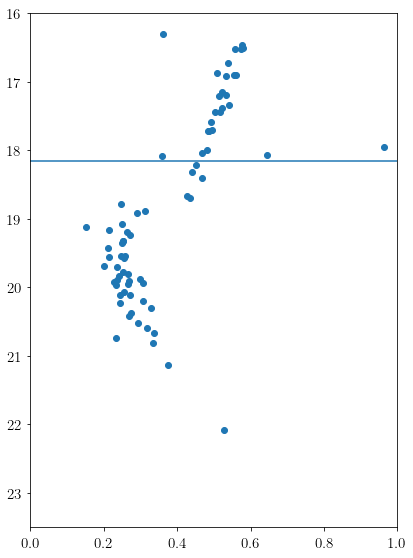

In [66]:
plt.figure(figsize=(6,8))
plt.scatter(mag_sfd_g-mag_sfd_r, mag_sfd_g)
plt.xlim(0,1)
plt.ylim(23.5, 16)

import filter_data
reload(filter_data)
err = lambda x: 0.0010908679647672335 + np.exp((x - 27.091072029215375) / 1.0904624484538419)
mu, age, z = 15.46, 13.3, 0.00039

# plt.plot(iso0.color, iso0.mag+mu, 'k')
# plt.plot(iso1.color, iso1.mag+mu, 'r')
# plt.plot(iso2.color, iso2.mag+mu, 'g')

gmin = 19.5 - (16.8 - mu)
plt.axhline(gmin)

mk = filter_data.mkpol(mu=mu, age=age, z=z, dmu=0.5, C=[0.05, 0.05], E=2., err=err, survey='DECaLS')
# plt.plot(mk[:,0], mk[:,1]+mu, c='k')

plt.show()

In [1]:
plt.figure(figsize=(6,8))
# plt.scatter(m2['MAG_SFD_G']-m2['MAG_SFD_R'], m2['MAG_SFD_G'])
# plt.scatter(m2['MAG_G']-m2['MAG_R'], m2['MAG_G'])
plt.scatter(mag_sfd_g-mag_sfd_r, mag_sfd_g)
# plt.scatter(mag_g-mag_r, mag_g)
plt.xlim(0,1)
plt.ylim(23.5, 16)

import filter_data
reload(filter_data)
err = lambda x: 0.0010908679647672335 + np.exp((x - 27.091072029215375) / 1.0904624484538419)
# mu, age, z = 15.46, 12., 0.0004
mu, age, z = 15.46, 13.3, 0.00039

iso = filter_data.isochrone_factory('Dotter', survey='DES', age=age, distance_modulus=mu, z=z)
mk = filter_data.mkpol(mu=mu, age=age, z=z, dmu=0.5, C=[0.05, 0.05], E=2., err=err, survey='DECaLS')
# plt.plot(mk[:,0]+0.1, mk[:,1]+mu+0.2)
# plt.plot(iso.color+0.12, iso.mag+mu+0.5, c='k')
plt.plot(mk[:,0], mk[:,1]+mu, c='k')
print(iso.distance_modulus, iso.age, iso.z, iso.filename)
# plt.plot(iso.color, iso.mag+mu, c='k')
print(iso.z2feh(z))
# plt.plot(g2-r2, g2+mu, c='k', ls='--', lw=3)
plt.show()

NameError: name 'plt' is not defined

In [10]:
import filter_data
reload(filter_data)
err = lambda x: 0.0010908679647672335 + np.exp((x - 27.091072029215375) / 1.0904624484538419)
# mu, age, z = 15.46, 12., 0.0004
mu, age, z = 15.46, 13.3, 0.00039

iso = filter_data.isochrone_factory('Dotter', survey='DES', age=age, distance_modulus=mu, z=z)
iso.feh2z(-1.5)

0.0004705846706524006

In [ ]:
plt.figure(figsize=(6,8))
# plt.scatter(m2['MAG_SFD_G']-m2['MAG_SFD_R'], m2['MAG_SFD_G'])
# plt.scatter(m2['MAG_G']-m2['MAG_R'], m2['MAG_G'])
plt.scatter(mag_sfd_g-mag_sfd_r, mag_sfd_g)
# plt.scatter(mag_g-mag_r, mag_g)
plt.xlim(0,1)
plt.ylim(23.5, 16)

import filter_data
reload(filter_data)
err = lambda x: 0.0010908679647672335 + np.exp((x - 27.091072029215375) / 1.0904624484538419)
# mu, age, z = 15.46, 12., 0.0004
mu, age, z = 15.46, 13.3, 0.00039

iso = filter_data.isochrone_factory('Dotter', survey='DES', age=age, distance_modulus=mu, z=z)
mk = filter_data.mkpol(mu=mu, age=age, z=z, dmu=0.5, C=[0.05, 0.05], E=2., err=err, survey='DECaLS')
# plt.plot(mk[:,0]+0.1, mk[:,1]+mu+0.2)
# plt.plot(iso.color+0.12, iso.mag+mu+0.5, c='k')
plt.plot(mk[:,0], mk[:,1]+mu, c='k')
print(iso.distance_modulus, iso.age, iso.z, iso.filename)
# plt.plot(iso.color, iso.mag+mu, c='k')
print(iso.z2feh(z))
# plt.plot(g2-r2, g2+mu, c='k', ls='--', lw=3)
plt.show()

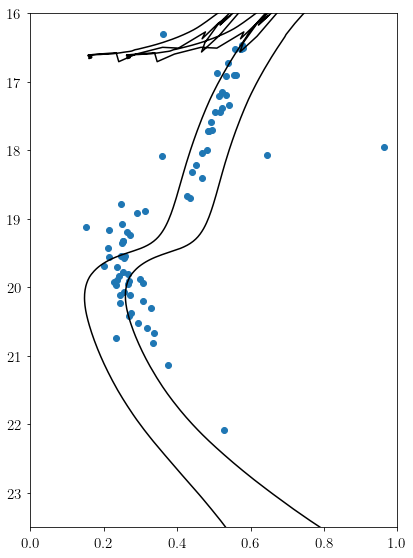

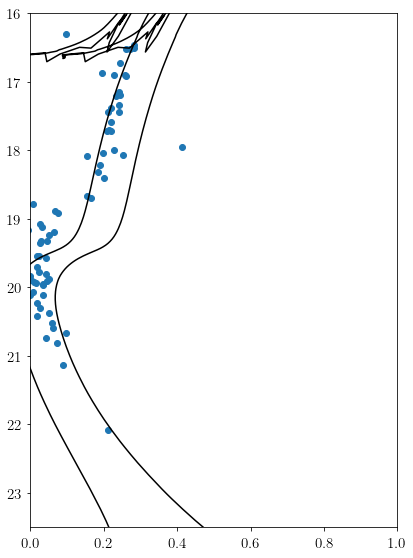

In [81]:
plt.figure(figsize=(6,8))
plt.scatter(mag_sfd_g-mag_sfd_r, mag_sfd_g)
plt.xlim(0,1)
plt.ylim(23.5, 16)

import filter_data
reload(filter_data)
mk = filter_data.mkpol(mu=mu, age=age, z=z, dmu=0.5, C=[0.05, 0.05], E=2., err=err, survey='DECaLS')
plt.plot(mk[:,0], mk[:,1]+mu, c='k')

plt.figure(figsize=(6,8))
plt.scatter(mag_sfd_r-mag_sfd_z, mag_sfd_g)
plt.xlim(0,1)
plt.ylim(23.5, 16)

mk = filter_data.mkpol_grz(mu=mu, age=age, z=z, dmu=0.5, C=[0.05, 0.05], E=2., err=err, survey='DECaLS')
plt.plot(mk[:,0], mk[:,1]+mu, c='k')

plt.show()

In [327]:
pix = 2815

fn = '../data/north_%0.5d.fits' %pix
fs = '../data/south_%0.5d.fits' %pix

In [379]:
dn = fitsio.open(fn)[1].data
ds = fitsio.open(fs)[1].data

sel = (dn['EXTENDED_CLASS'] == 0) & (dn['MAG_SFD_G'] > 16) & (dn['MAG_SFD_G'] < 23) & (dn['MAG_SFD_G'] - dn['MAG_SFD_R'] > 0) & (dn['MAG_SFD_G'] - dn['MAG_SFD_R'] < 1) 
dn = dn[sel]

sel = (ds['EXTENDED_CLASS'] == 0) & (ds['MAG_SFD_G'] > 16) & (ds['MAG_SFD_G'] < 23) & (ds['MAG_SFD_G'] - ds['MAG_SFD_R'] > 0) & (ds['MAG_SFD_G'] - ds['MAG_SFD_R'] < 1) 
ds = ds[sel]

dn0 = np.copy(dn)
ds0 = np.copy(ds)
print(dn0.size, ds0.size)


4688 5390


In [380]:
from astropy.coordinates import SkyCoord
import astropy.units as u

coord1 = SkyCoord(dn['RA']*u.deg, dn['DEC']*u.deg)
coord2 = SkyCoord(ds['RA']*u.deg, ds['DEC']*u.deg)
match21, d2d_21, _ = coord2.match_to_catalog_sky(coord1)
match12, d2d_12, _ = coord1.match_to_catalog_sky(coord2)

thresh = 1*u.arcsec
dn = ds0[d2d_21 < thresh]
ds = dn0[match21[d2d_21 < thresh]]

In [395]:
mu, age, z = 19, 12, 0.0004

In [396]:
ison = filter_data.isochrone_factory('Dotter', survey='PS1', age=12, distance_modulus=16, z=0.0004)
isos = filter_data.isochrone_factory('Dotter', survey='DES', age=12, distance_modulus=16, z=0.0004)


In [397]:
reload(filter_data)
mkn = filter_data.mkpol(mu=mu, age=age, z=z, dmu=0.5, C=[0.05, 0.05], E=2., err=err, survey='DECaLS')
mks = filter_data.mkpol(mu=mu, age=age, z=z, dmu=0.5, C=[0.05, 0.05], E=2., err=err, survey='BASS')

/Users/nora/.ugali/isochrones/ps1/dotter2016/iso_a12.0_z0.00040.dat


In [398]:
from matplotlib.path import Path

mag_g = dn['MAG_SFD_G']
mag_r = dn['MAG_SFD_R']

pth = Path(mkn)
cm = np.vstack([mag_g - mag_r, mag_g - mu]).T
idxn = pth.contains_points(cm)

########

mag_g = ds['MAG_SFD_G']
mag_r = ds['MAG_SFD_R']

pth = Path(mks)
cm = np.vstack([mag_g - mag_r, mag_g - mu]).T
idxs = pth.contains_points(cm)


In [400]:
idxn.sum(), idxs.sum()

(753, 689)

(23, 16)

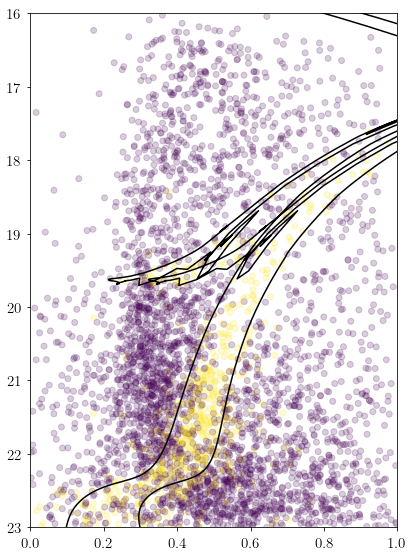

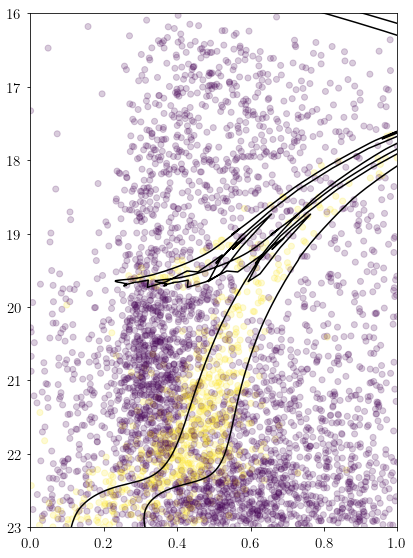

In [399]:
plt.figure(figsize=(6,8))
plt.scatter(dn['MAG_SFD_G'] - dn['MAG_SFD_R'], dn['MAG_SFD_G'], alpha=0.2, c=idxs)
plt.plot(mkn[:,0], mkn[:,1]+mu, c='k')
plt.xlim(0,1)
plt.ylim(23,16)

plt.figure(figsize=(6,8))
plt.scatter(ds['MAG_SFD_G'] - ds['MAG_SFD_R'], ds['MAG_SFD_G'], alpha=0.2, c=idxn)
plt.plot(mks[:,0], mks[:,1]+mu, c='k')
plt.xlim(0,1)
plt.ylim(23,16)

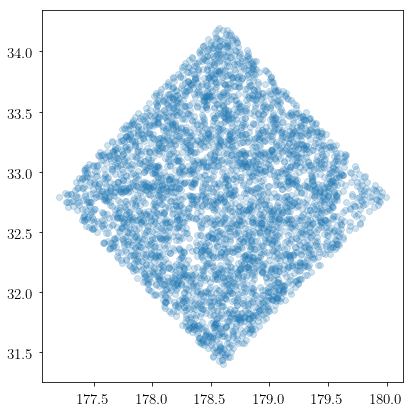

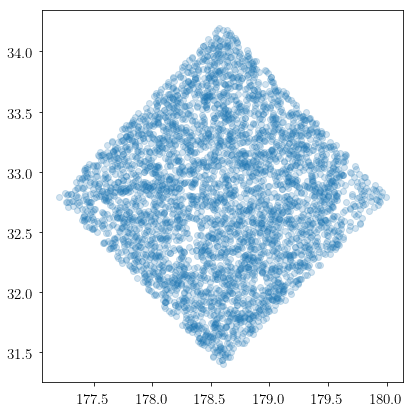

In [385]:
plt.figure(figsize=(6,6))
plt.scatter(dn['RA'], dn['DEC'], alpha=0.2)

plt.figure(figsize=(6,6))
plt.scatter(ds['RA'], ds['DEC'], alpha=0.2)


plt.show()

In [82]:
filename = '/Users/nora/projects/stream_search/data/decals_dr8_iso_hpxcube_v4.fits.gz'
hpxcube_south, fracdet_south, modulus = plot_density.load_hpxcube(filename)

filename = '/Users/nora/projects/stream_search/data/bass_dr8_iso_hpxcube_v0.fits.gz'
hpxcube_north, fracdet_north, modulus_north = plot_density.load_hpxcube(filename)

# filename = '/Users/nora/projects/stream_search/data/iso_hpxcube_ps1_v2.fits.gz'
# hpxcube_ps1, fracdet_ps1, modulus_ps1 = plot_density.load_hpxcube(filename)

Reading /Users/nora/projects/stream_search/data/decals_dr8_iso_hpxcube_v4.fits.gz...
Skipping fracdet...
Reading /Users/nora/projects/stream_search/data/bass_dr8_iso_hpxcube_v0.fits.gz...
Skipping fracdet...


In [445]:
mask_north = hpxcube_north > 32
mask_south = hpxcube_south > 32

In [450]:
mask = mask_north & mask_south
print(mask.sum(), mask_north.sum(), mask_south.sum())

1989 159079 438431


In [453]:
mbin = 20
ratio = hpxcube_north[mask[:,mbin],mbin]/hpxcube_south[mask[:,mbin],mbin]

In [454]:
ratio.shape, mask[:,40].sum()

((21,), 0)

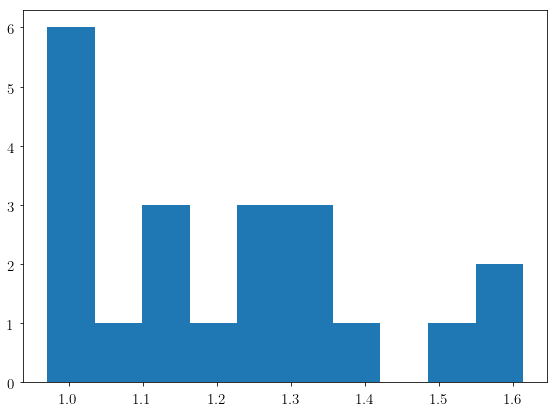

In [457]:
plt.figure(figsize=(8,6))
plt.hist(ratio, bins=10)
# plt.xlim(0,2.5)
plt.show()

# Filtered Data

In [10]:
filename = '/Users/nora/projects/stream_search/data/decals_dr8_iso_hpxcube_v6.fits.gz'
# filename = '/Users/nora/projects/stream_search/data/bass_dr8_iso_hpxcube_v0.fits.gz'
hpxcube, fracdet, modulus = plot_density.load_hpxcube(filename)

filename = '/Users/nora/projects/stream_search/data/decals_dr8_iso_hpxcube_v4.fits.gz'
# filename = '/Users/nora/projects/stream_search/data/bass_dr8_iso_hpxcube_v0.fits.gz'
hpxcube4, fracdet, modulus = plot_density.load_hpxcube(filename)

filename = '/Users/nora/projects/stream_search/data/decals_dr8_iso_hpxcube_v4.fits.gz'
# filename = '/Users/nora/projects/stream_search/data/bass_dr8_iso_hpxcube_v0.fits.gz'
hpxcube1, fracdet, modulus = plot_density.load_hpxcube(filename)


filename = '/Users/nora/projects/stream_search/data/bass_dr8_iso_hpxcube_v6.fits.gz'
hpxcube_north, fracdet_north, modulus_north = plot_density.load_hpxcube(filename)
filename = '/Users/nora/projects/stream_search/data/bass_dr8_iso_hpxcube_v0.fits.gz'
hpxcube_north1, fracdet_north, modulus_north = plot_density.load_hpxcube(filename)

filename = '/Users/nora/projects/stream_search/data/iso_hpxcube_ps1_v2.fits.gz'
hpxcube_ps1, fracdet_ps1, modulus_ps1 = plot_density.load_hpxcube(filename)

Reading /Users/nora/projects/stream_search/data/decals_dr8_iso_hpxcube_v6.fits.gz...
Skipping fracdet...
Reading /Users/nora/projects/stream_search/data/decals_dr8_iso_hpxcube_v4.fits.gz...
Skipping fracdet...
Reading /Users/nora/projects/stream_search/data/decals_dr8_iso_hpxcube_v4.fits.gz...
Skipping fracdet...
Reading /Users/nora/projects/stream_search/data/bass_dr8_iso_hpxcube_v6.fits.gz...
Skipping fracdet...
Reading /Users/nora/projects/stream_search/data/bass_dr8_iso_hpxcube_v0.fits.gz...
Skipping fracdet...
Reading /Users/nora/projects/stream_search/data/iso_hpxcube_ps1_v2.fits.gz...
Skipping fracdet...


In [11]:
print(hpxcube.max(), hpxcube1.max())
print(hpxcube_north.max(), hpxcube_north1.max())

2120.0 2233.0
732.0 814.0


In [12]:
mw_streams.keys()

dict_keys(['VOD/VSS', 'Monoceros', 'EBS', 'Her-Aq', 'PAndAS', 'Tri-And', 'Tri-And2', 'PiscesOv', 'EriPhe', 'Phoenix', 'WG1', 'WG2', 'WG3', 'WG4', 'Acheron', 'Cocytos', 'Lethe', 'Styx', 'ACS', 'Pal15', 'Eridanus', 'TucanaIII', 'Indus', 'Jhelum', 'Ravi', 'Chenab', 'Elqui', 'Aliqa_Uma', 'Turbio', 'Willka_Yaku', 'Turranburra', 'Wambelong', 'Palca', 'Jet', 'Gaia-1', 'Gaia-2', 'Gaia-3', 'Gaia-4', 'Gaia-5', 'PS1-A', 'PS1-B', 'PS1-C', 'PS1-D', 'PS1-E', 'ATLAS', 'Ophiucus', 'Sangarius', 'Scamander', 'Corvus', '20.0-1', 'Sgr-L10', 'Orphan', 'Pal5', 'GD-1', 'Tri/Pis', 'NGC5466', 'Alpheus', 'Hermus', 'Hyllus', 'Cetus', 'Kwando', 'Molonglo', 'Murrumbidgee', 'Orinoco', 'Phlegethon', 'Slidr', 'Sylgr', 'Ylgr', 'Fimbulthul', 'Svol', 'Fjorm', 'Gjoll', 'Leiptr'])

In [13]:
mu = 16.0
data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=True, center=True, sgr=False, bmax=25, cmax=40)
data_north = plot_density.prepare_hpxmap(mu, hpxcube_north, fracdet_north, modulus_north, clip=100, plane=True, center=True, sgr=False, bmax=25, cmax=40)
data_ps1 = plot_density.prepare_hpxmap(mu, hpxcube_ps1, fracdet_ps1, modulus_ps1, clip=100, plane=True, center=True, sgr=False, bmax=25, cmax=40)
bkg = 0

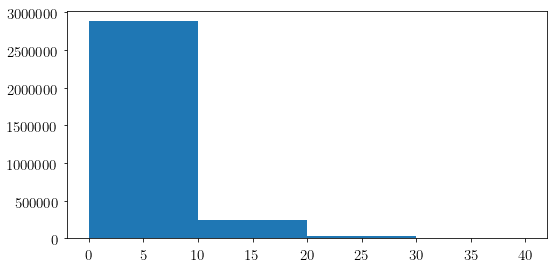

In [14]:
plt.figure(figsize=(8,4))
plt.hist(data, bins=np.arange(0,50,10))
plt.show()

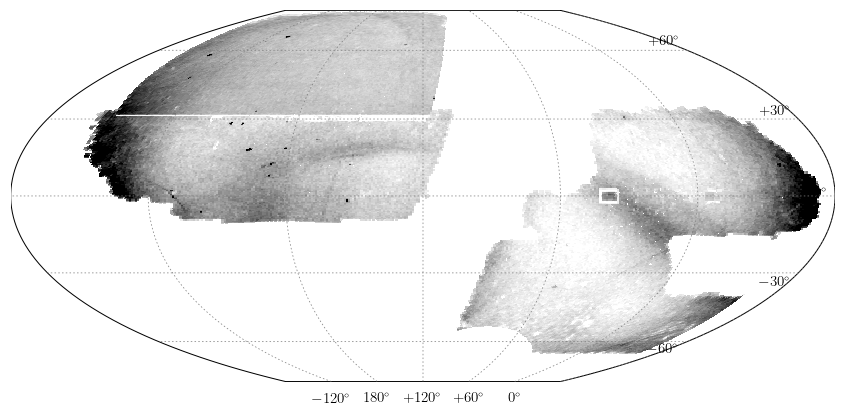

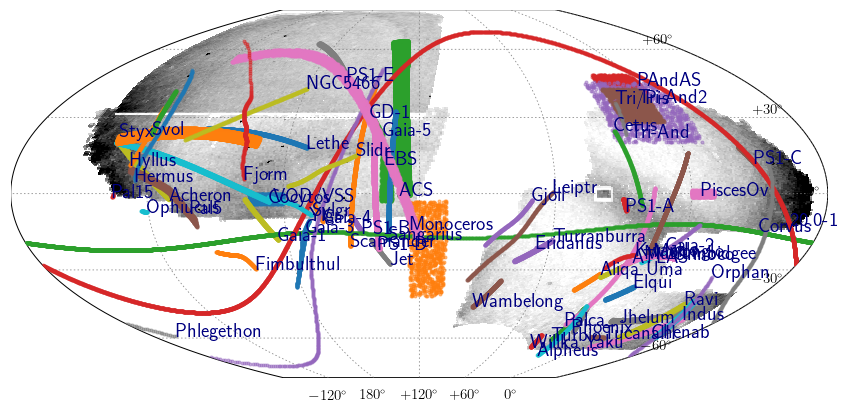

In [16]:
reload(plot_density)
smap = plot_density.plot_density(data, bkg, center=(120,30), vmax=18)
smap = plot_density.plot_density(data_north, bkg, center=(120,30), vmax=20, smap=smap)
# smap = plot_density.plot_density(data_ps1, bkg, center=(120,30), vmax=20, smap=smap)

# smap = plot_density.plot_density(data_ps1, bkg, center=(120,30), vmax=20)
smap = plot_density.plot_density(data, bkg, center=(120,30), vmax=20)
smap = plot_density.plot_density(data_north, bkg, center=(120,30), vmax=20, smap=smap)

# plot_density.plot_stream_list(smap, ['GD-1'])
plot_density.plot_streams(smap, mu, dmu=100)
# plot_density.plot_dwarfs_globs(smap, data, mu, 50, coords=coords, coord_stream=stream)

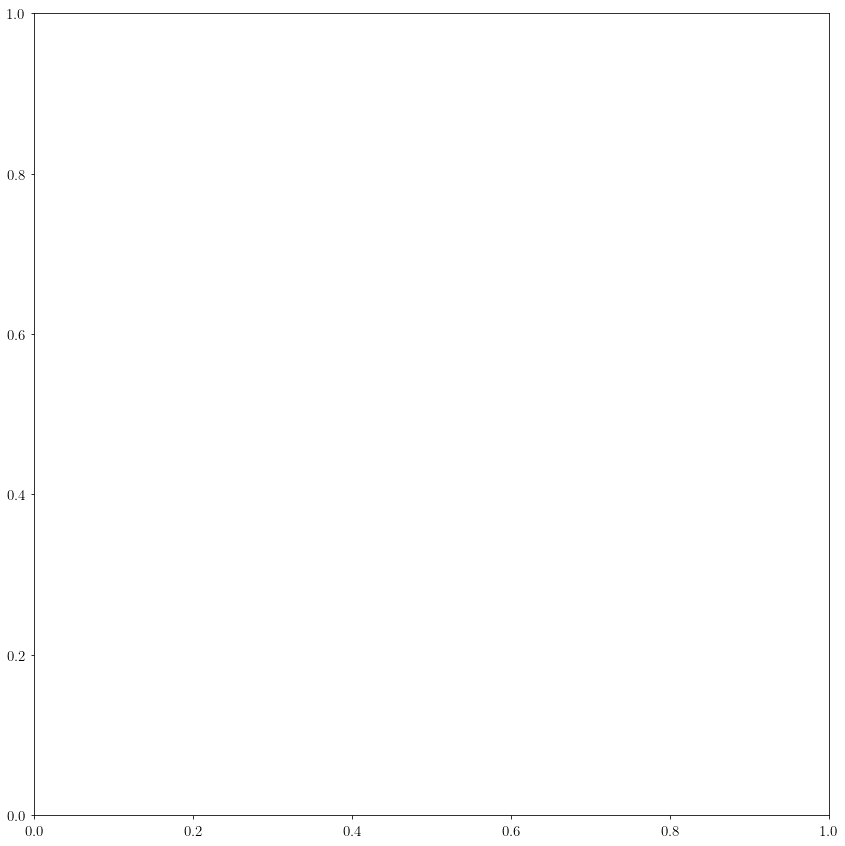

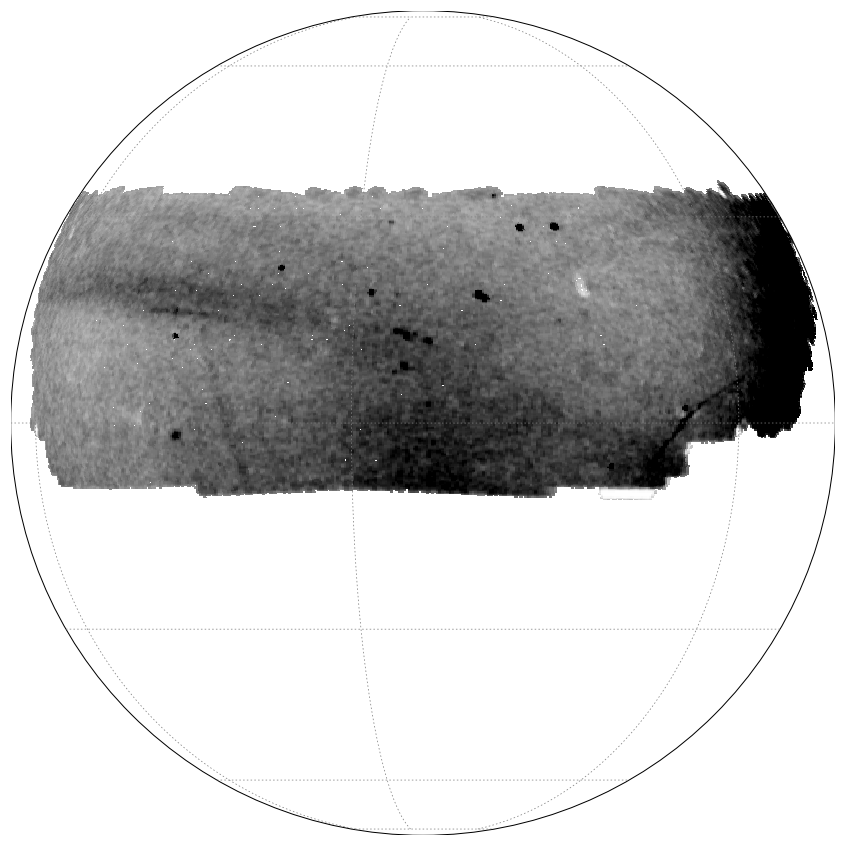

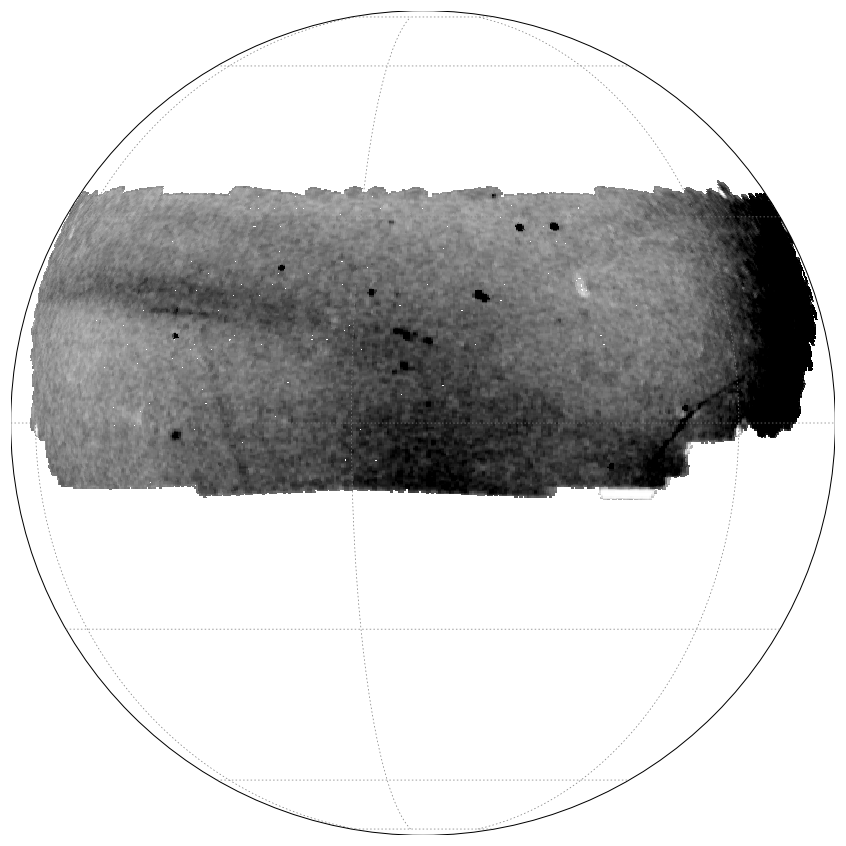

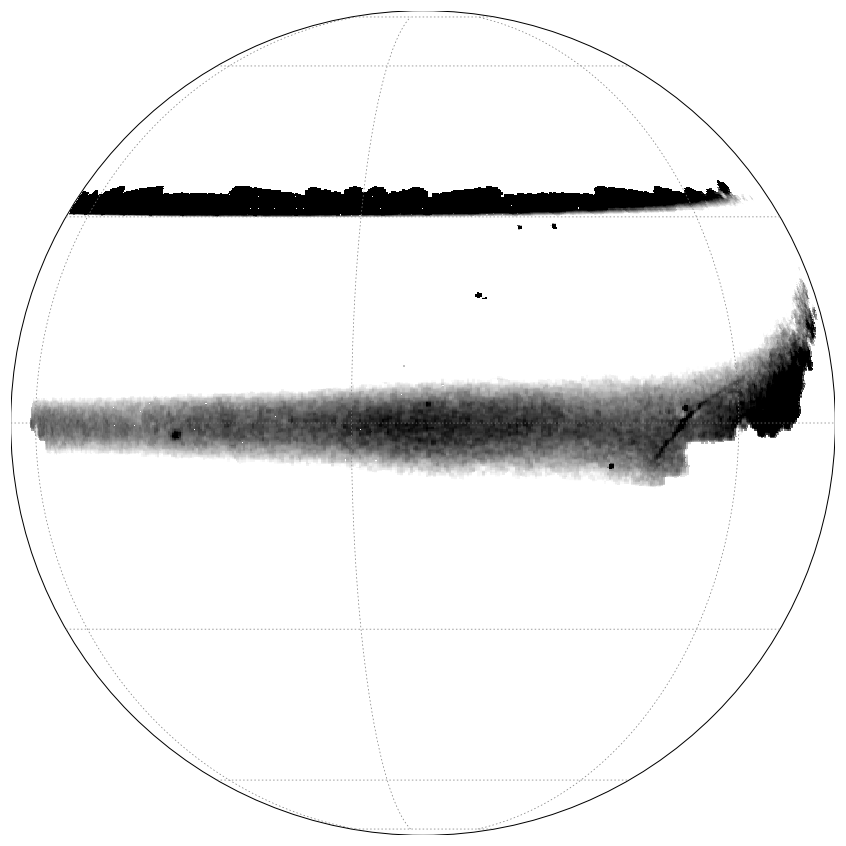

In [74]:
reload(plot_density)
mu = 16
coords='cel'
lon, lat = 190, 0
center = (lon, lat)
vmin, vmax = 0, 12
# vmin, vmax = 0, 12
# vmin, vmax = None, None
sigma = 0.2
proj = 'ortho'
stream = 'ATLAS'

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, proj=proj, sigma=sigma, deg=5)
# bkg = 0
bkg2 = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, sigma=sigma, deg=5)

smap = plot_density.plot_density(data, 0, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)
smap = plot_density.plot_density(data, bkg, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)
smap = plot_density.plot_density(data, bkg2, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)

# smap = plot_density.plot_density(bkg, 0, center=center, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)

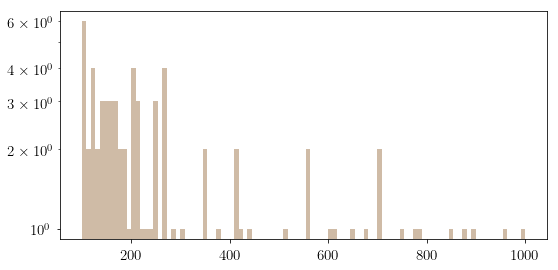

In [65]:
bins = np.linspace(100, 1000, 100)
plt.figure(figsize=(8,4))
plt.hist(data, bins=bins, alpha=0.3)
plt.hist(data-bkg, bins=bins, alpha=0.3)
plt.yscale('log')

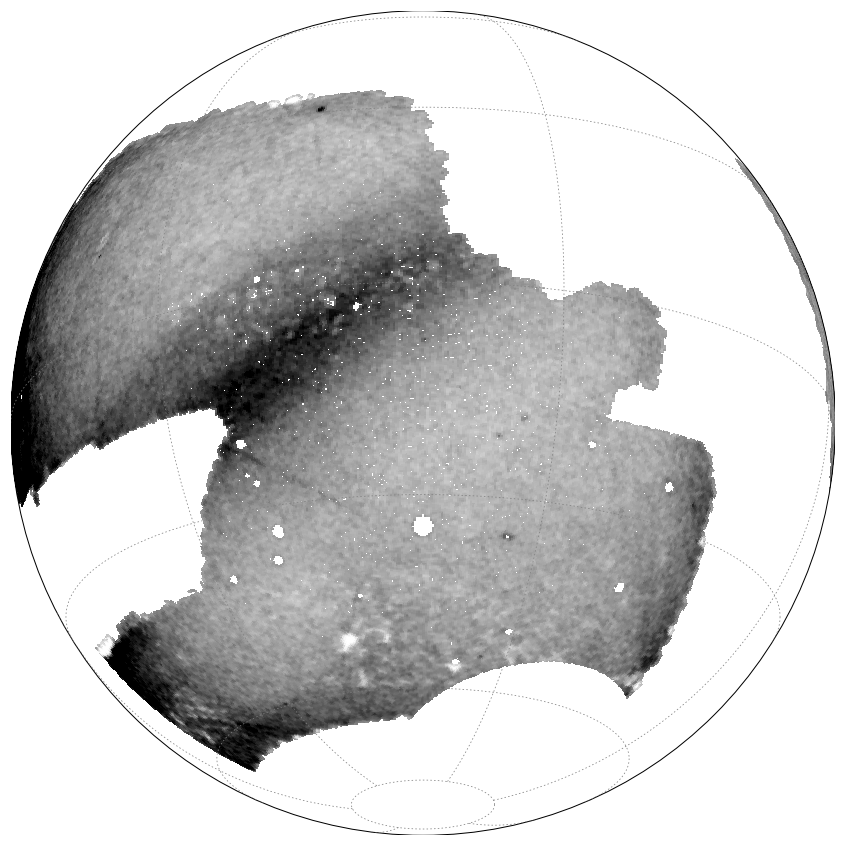

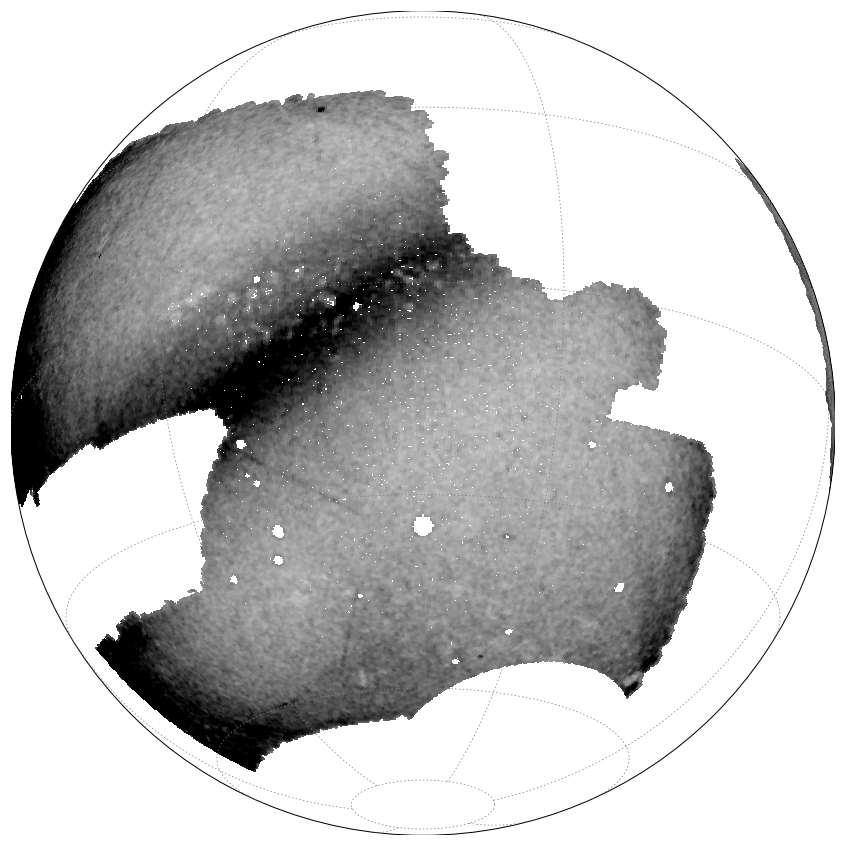

In [64]:
reload(plot_density)
mu = 16
coords='cel'
lon, lat = 40, -20
center = (lon, lat)
vmin, vmax = 0, 12
# vmin, vmax = 0, 12
# vmin, vmax = None, None
sigma = 0.2
proj = 'ortho'
stream = 'ATLAS'

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
data4 = plot_density.prepare_hpxmap(mu, hpxcube4, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
# bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, proj=proj, sigma=sigma, deg=5)
bkg = 0

smap = plot_density.plot_density(data, bkg, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)
smap = plot_density.plot_density(data4, bkg, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)

# smap = plot_density.plot_density(bkg, 0, center=center, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)

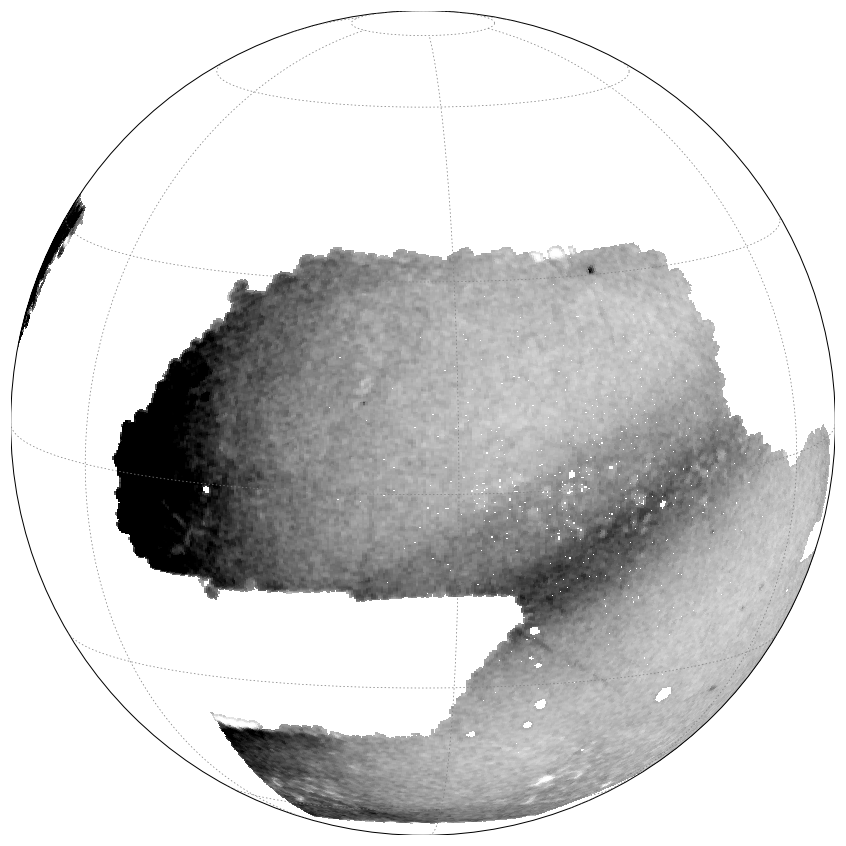

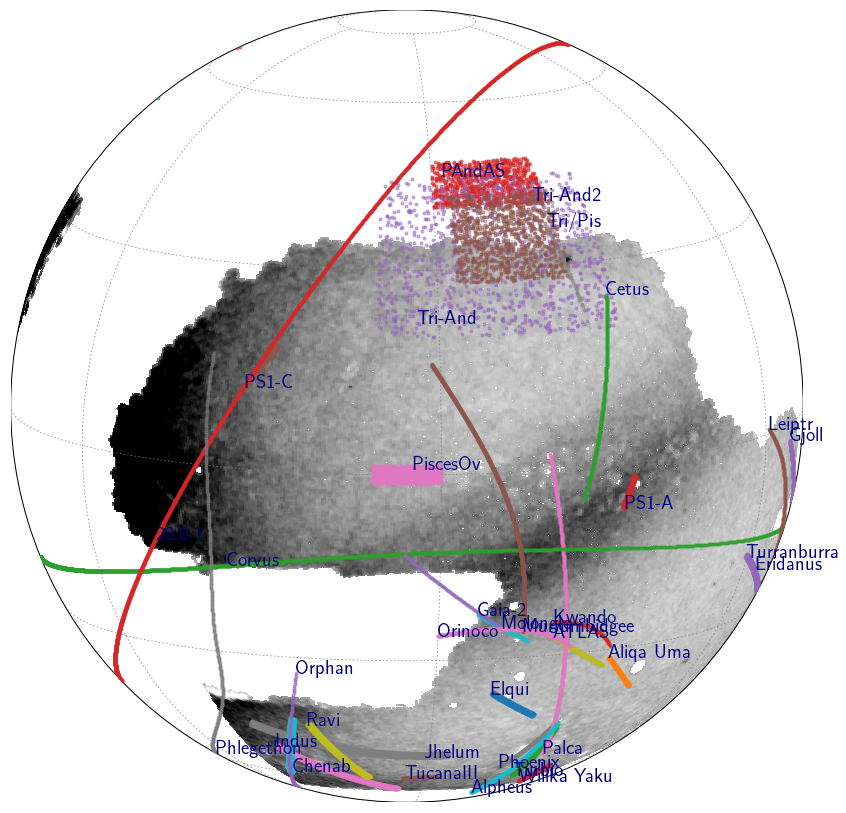

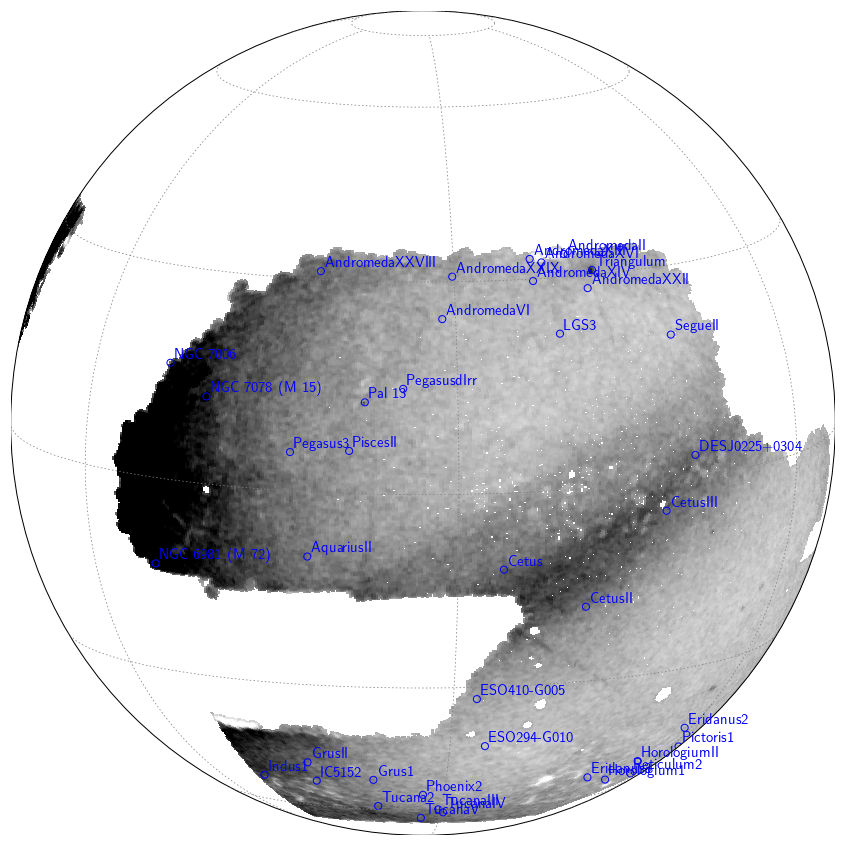

In [72]:
reload(plot_density)
mu = 16
coords='cel'
lon, lat = -5, 10
center = (lon, lat)
vmin, vmax = 0, 15
# vmin, vmax = 0, 12
# vmin, vmax = None, None
sigma = 0.2
proj = 'ortho'
stream = 'ATLAS'

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
# bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, proj=proj, sigma=sigma, deg=5)
bkg = 0

smap = plot_density.plot_density(data, bkg, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)

smap = plot_density.plot_density(data, bkg, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)
plot_density.plot_streams(smap, mu, dmu=100)

smap = plot_density.plot_density(data, bkg, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)
plot_density.plot_dwarfs_globs(smap, data, mu, 50, coords=coords, coord_stream=stream)

# smap = plot_density.plot_density(bkg, 0, center=center, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)

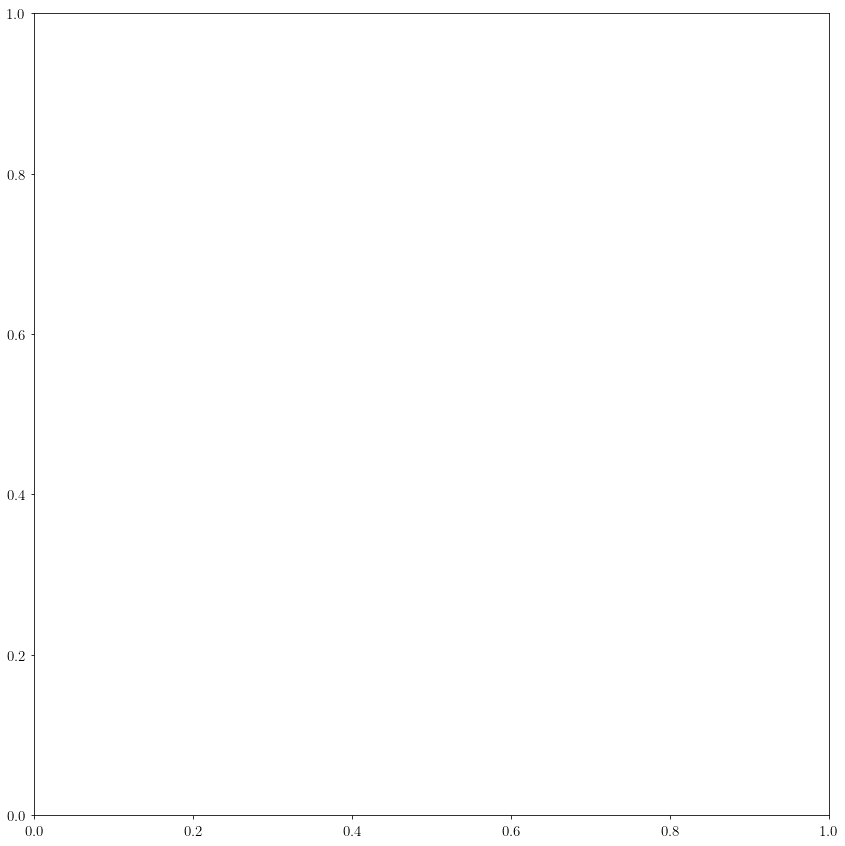

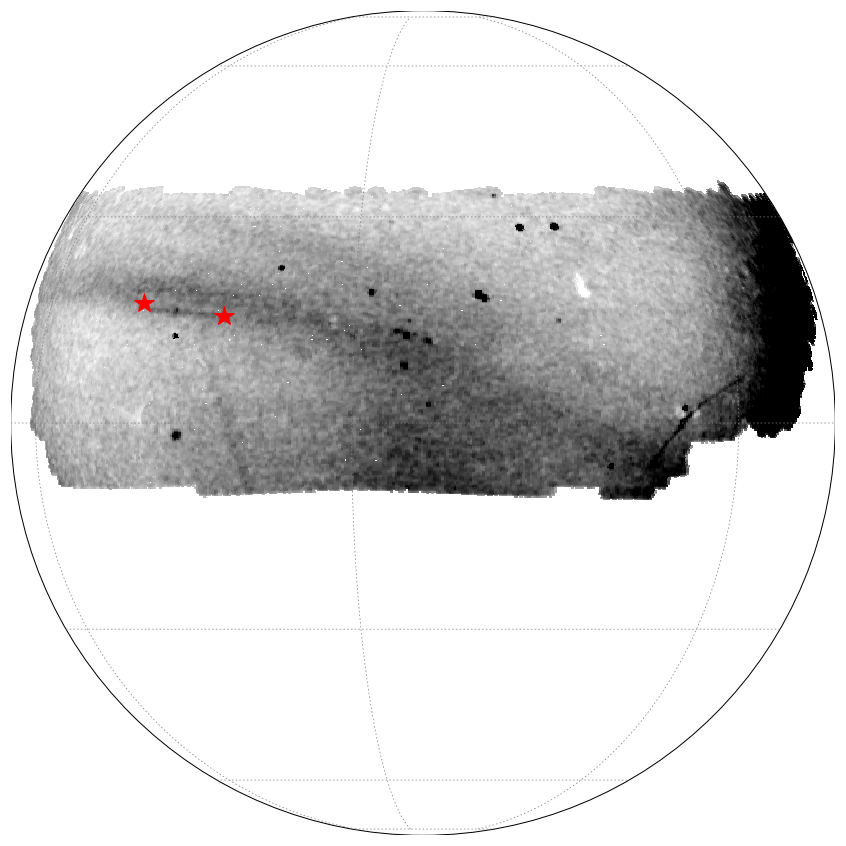

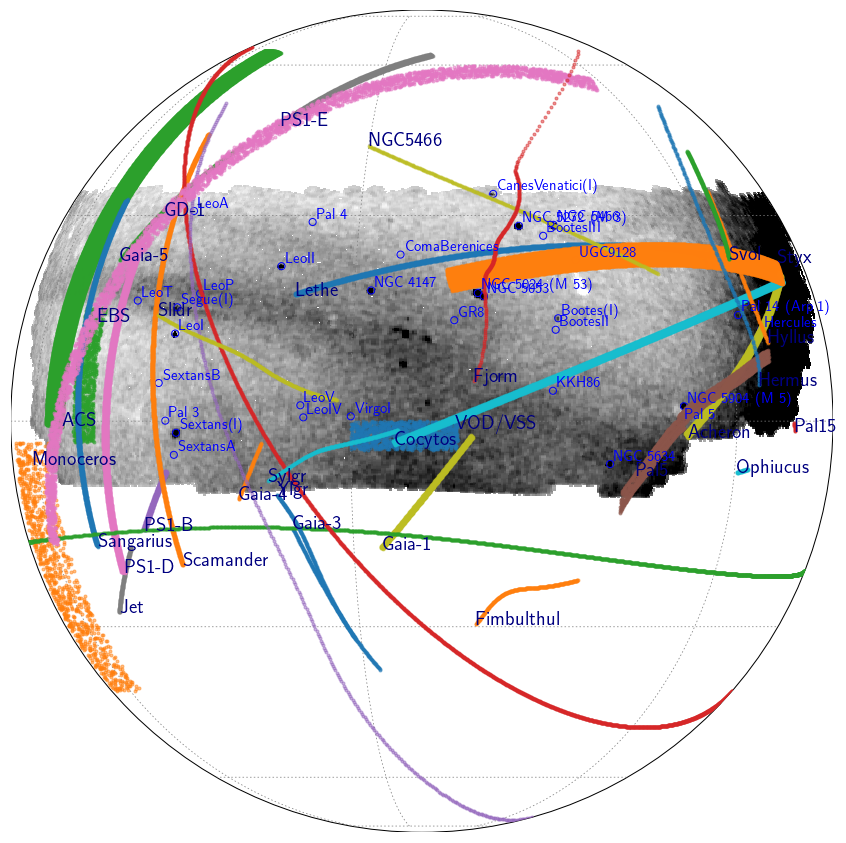

In [258]:
reload(plot_density)
mu = 16
coords='cel'
lon, lat = 190, 0
center = (lon, lat)
vmin, vmax = -40, 15
sigma = 0.2
proj = 'ortho'

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, proj=proj, sigma=sigma, deg=5)

smap = plot_density.plot_density(data, bkg, center=center, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)
# smap = plot_density.plot_density(data_north, 0, center=(lon,lat), vmax=vmax, coords=coords, proj='ortho', xsize=3000, smooth=sigma, smap=smap)

# smap = plot_density.plot_density(bkg, 0, center=center, vmax=vmax, coords='cel', proj=proj, xsize=3000, smooth=sigma)

x1, y1 = smap(150-5,15+2)
x2, y2 = smap(150+10,15)
# x, y = smap(150, 15)
smap.plot([x1,x2], [y1,y2], 'r*', ms=20)

# smap = plot_density.plot_density(data, 0, center=(lon, lat), vmax=300, coords='gal', proj='ortho', xsize=2000)
# plot_density.plot_stream_list(smap, ['ATLAS', 'Molonglo', 'Murrumbidgee', 'Orinoco', 'Kwando'], coords='gal')

# smap = plot_density.plot_density(data, 0, center=(lon, lat), vmax=vmax, coords=coords, proj='ortho', xsize=2000, smooth=0.2)
# plot_density.plot_streams(smap, mu, 50, coords=coords)

smap = plot_density.plot_density(data, bkg, center=center, vmax=vmax, coords=coords, proj=proj, xsize=1000, smooth=sigma)
plot_density.plot_streams(smap, mu, dmu=100)
plot_density.plot_dwarfs_globs(smap, data, mu, 50, coords=coords, coord_stream=stream)

In [29]:
np.arange(14, 18.05, 0.1)

array([14. , 14.1, 14.2, 14.3, 14.4, 14.5, 14.6, 14.7, 14.8, 14.9, 15. ,
       15.1, 15.2, 15.3, 15.4, 15.5, 15.6, 15.7, 15.8, 15.9, 16. , 16.1,
       16.2, 16.3, 16.4, 16.5, 16.6, 16.7, 16.8, 16.9, 17. , 17.1, 17.2,
       17.3, 17.4, 17.5, 17.6, 17.7, 17.8, 17.9, 18. ])

In [226]:
ends = [(145, 17), (160, 15)]

R = np.array(streamlib.get_rotmat(ends=ends))
print(R)

[[-0.8523808   0.44300773  0.27783289]
 [ 0.49075088  0.86117326  0.13245449]
 [-0.1805839   0.2492484  -0.95145399]]


In [224]:
# reload(plot_density)
# reload(streamlib)
# ends = [(145, 17), (160, 15)]
# for mu in modulus:
#     plot_density.plot_stream_zoom(hpxcube, fracdet, modulus, stream=None, ends=ends, mu=mu, width=0.3, sigma=0.2, delta=0.1, vmin=-2, vmax=5)
#     plt.savefig('../plots_%.1f_%.1f_%.1f_%.1f_%.1f.png' %(ends[0][0], ends[0][1], ends[1][0], ends[1][1], mu))

In [236]:
# 300S Hess
from astropy.io import fits as fitsio

data300 = fitsio.open('../data/300s_data.fits')[1].data

In [237]:
import rotation_matrix
phi1, phi2 = rotation_matrix.phi12_rotmat(data300['RA'], data300['DEC'], R)

In [256]:
on = np.abs(phi2) < 1
off = phi2 < -3
off2 = phi2 > -3

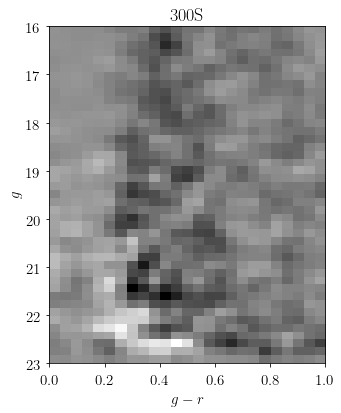

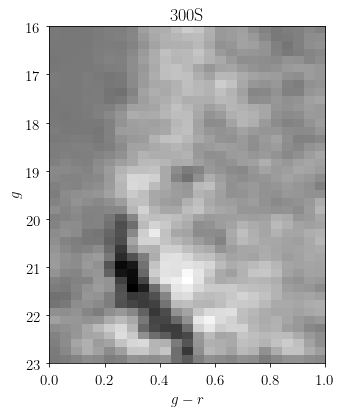

In [257]:
import plot_hess
plot_hess.plot_hess( '300S', data300[on], data300[off], gband='MAG_SFD_G', rband='MAG_SFD_R', gmax=23)
plot_hess.plot_hess('300S', data300[on], data300[off2], gband='MAG_SFD_G', rband='MAG_SFD_R', gmax=23)

(0, 0)
14.488135456452207


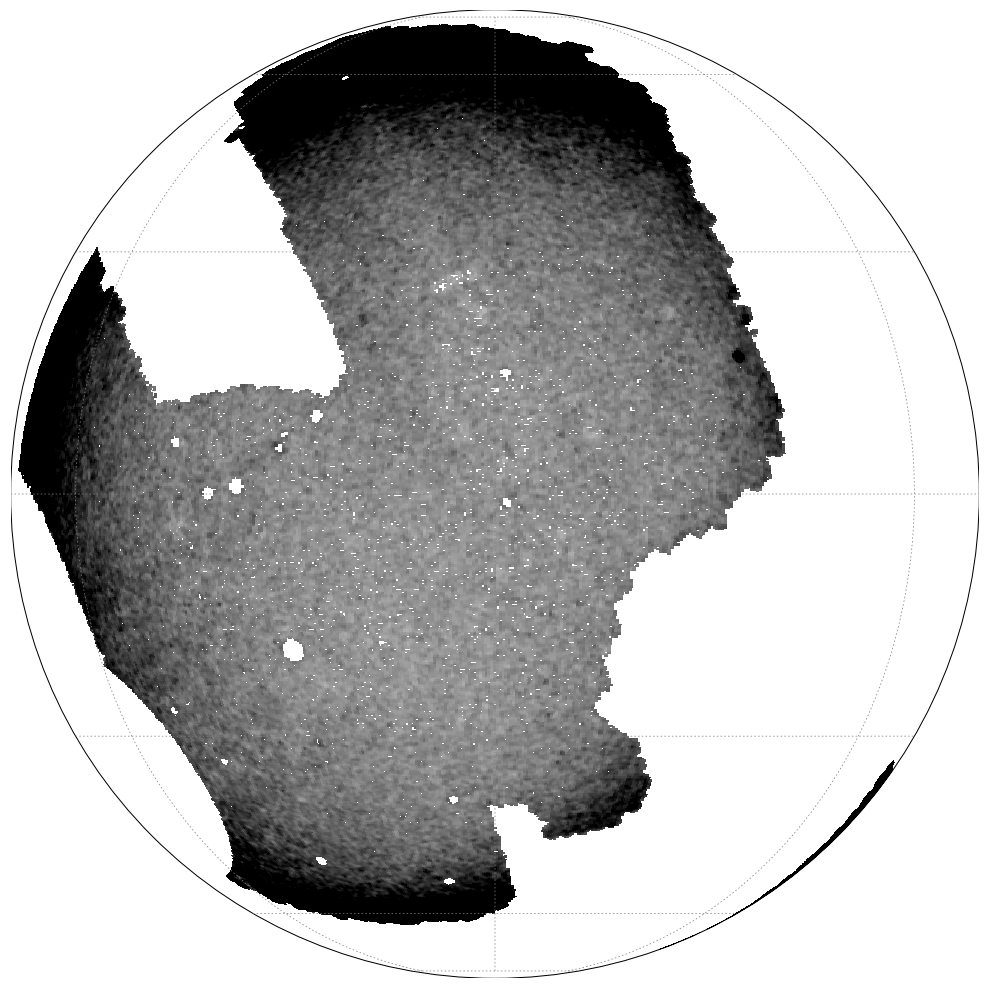

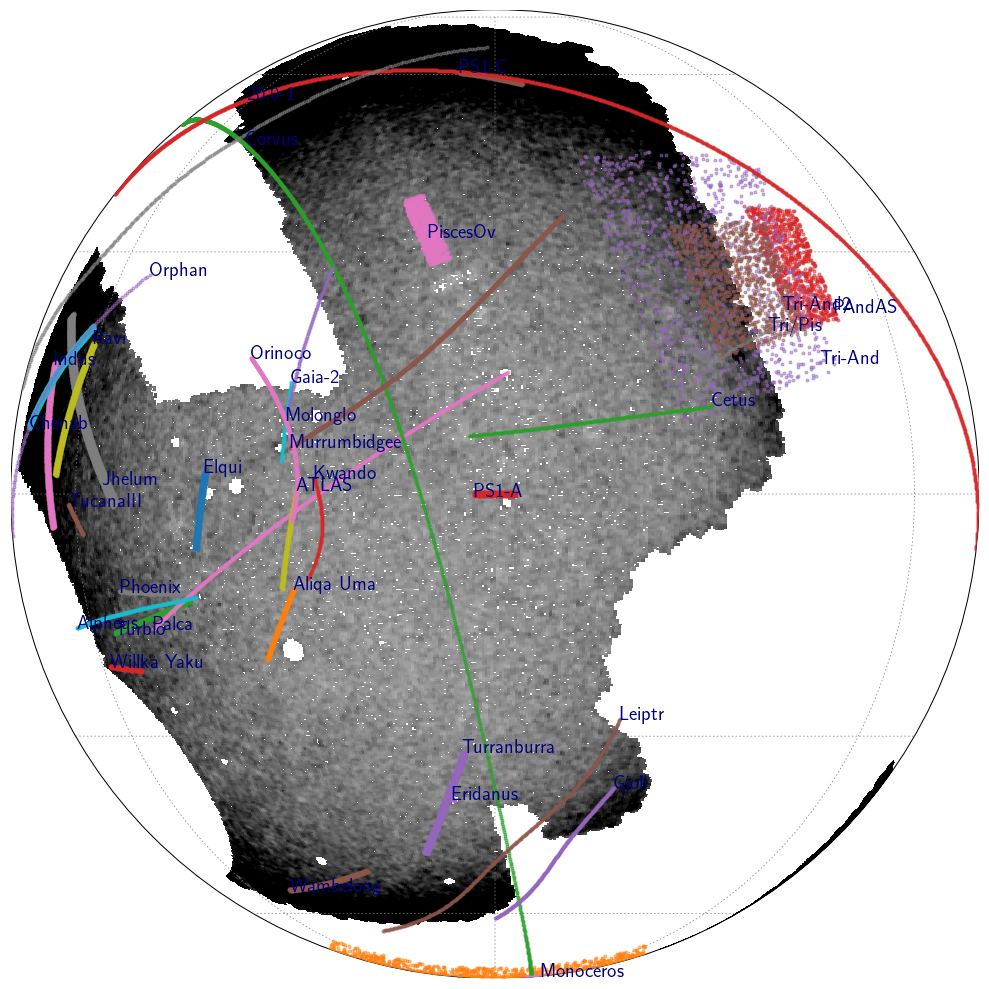

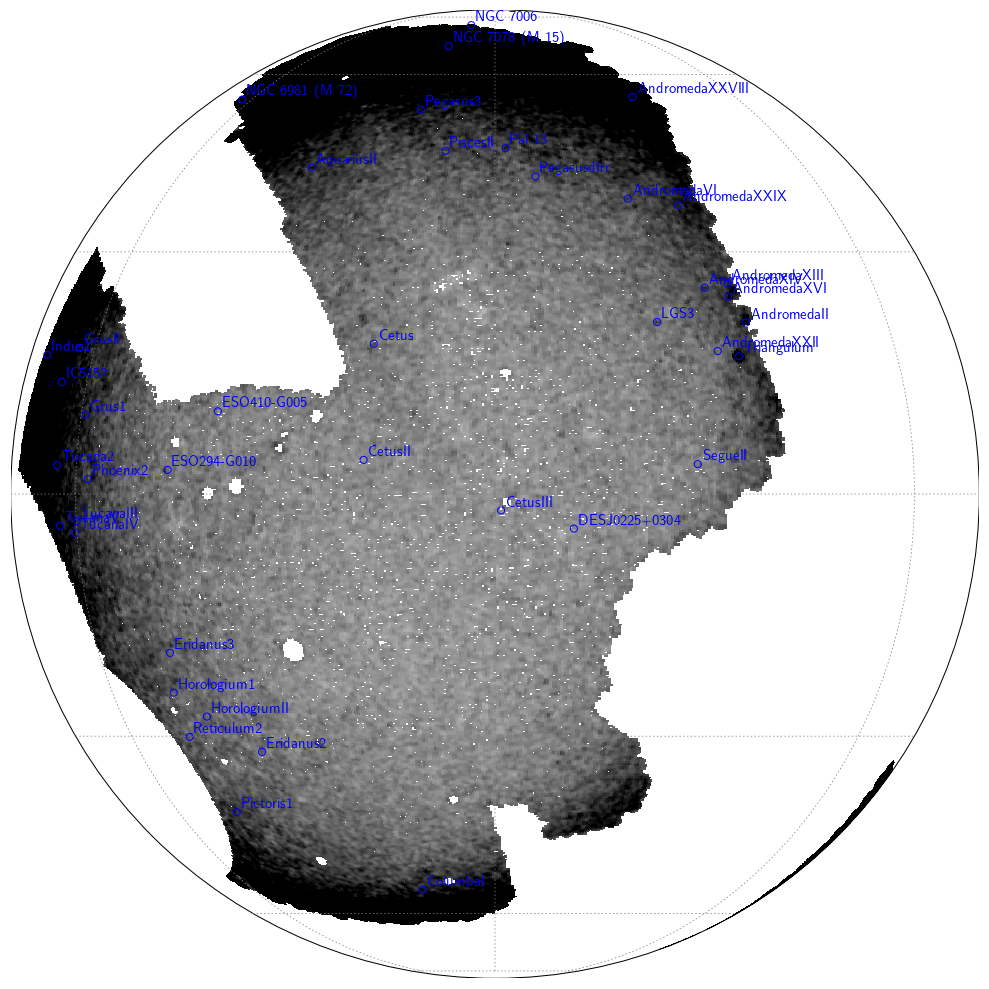

In [45]:
reload(plot_density)
reload(streamlib)

stream = 'PS1-A'
coords= 'stream'
sigma = 0.3

# mw_streams = galstreams.MWStreams(verbose=False)
if coords == 'cel':
    center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
elif coords == 'gal':
    center = (mw_streams[stream].l.mean(), mw_streams[stream].b.mean())
elif coords == 'stream':
    center = 0, 0
if center[0] > 180:
    center = (center[0] - 360, center[1])
print(center)
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
print(mu)

vmin = 0
vmax = 7
xsize = 1000

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
# bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, sigma=sigma, deg=5)
bkg = 0
smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# smap = plot_density.plot_density(data, 0, center=center, vmax=10, coords='cel', proj='ortho', xsize=xsize)

# smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# plot_density.plot_stream_list(smap, [stream], coords=coords, coord_stream=stream)

# smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# plot_density.plot_streams(smap, mu, 50, coords=coords, coord_stream=stream)

# smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# plot_density.plot_dwarfs_globs(smap, data, mu, 50, coords=coords, coord_stream=stream)

In [ ]:
reload(plot_density)
reload(streamlib)

stream = 'ATLAS'
coords= 'stream'
sigma = 0.3

# mw_streams = galstreams.MWStreams(verbose=False)
if coords == 'cel':
    center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
elif coords == 'gal':
    center = (mw_streams[stream].l.mean(), mw_streams[stream].b.mean())
elif coords == 'stream':
    center = 0, 0
if center[0] > 180:
    center = (center[0] - 360, center[1])
print(center)
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
print(mu)

vmin = 0
vmax = 7
xsize = 600

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
# bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, sigma=sigma, deg=5)
bkg = 0
smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# smap = plot_density.plot_density(data, 0, center=center, vmax=10, coords='cel', proj='ortho', xsize=xsize)

# smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# plot_density.plot_stream_list(smap, [stream], coords=coords, coord_stream=stream)

smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
plot_density.plot_streams(smap, mu, 50, coords=coords, coord_stream=stream)

smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
plot_density.plot_dwarfs_globs(smap, data, mu, 50, coords=coords, coord_stream=stream)

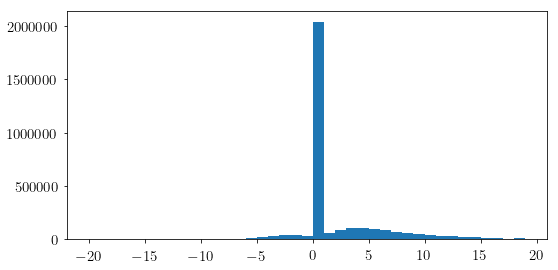

-11.233760868168329


In [67]:
plt.figure(figsize=(8,4))
plt.hist(data-bkg, bins=np.arange(-20,20))
plt.show()

print(np.min(data-bkg))

(-131.80355561967048, -78.84286539708054)
[-131.80355561967048, -90]
16.505149978319906


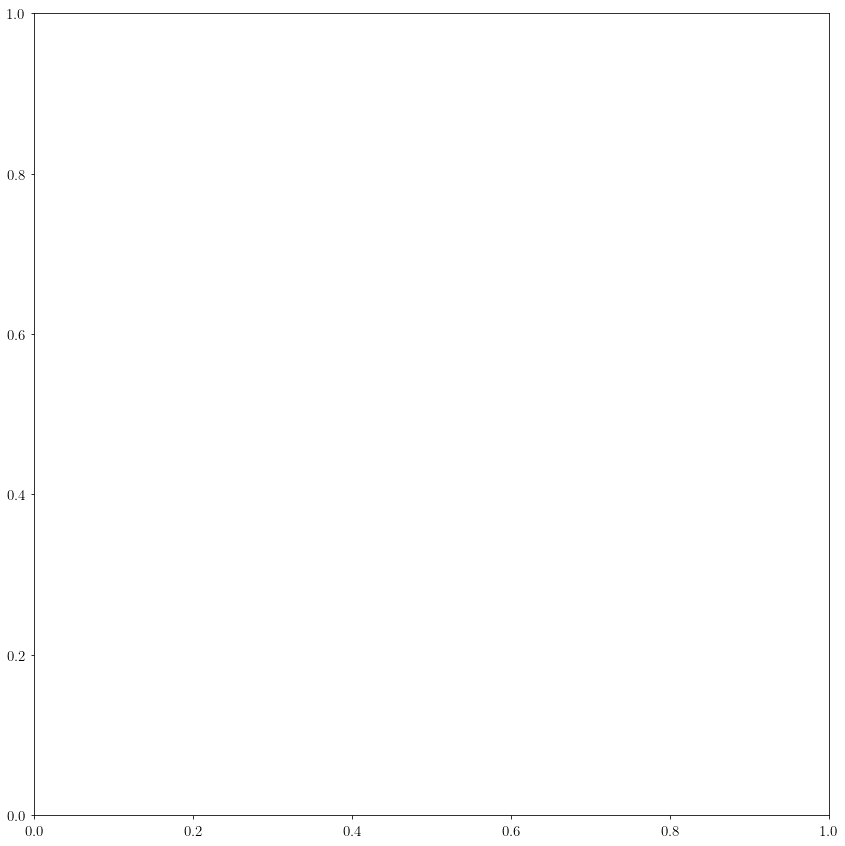

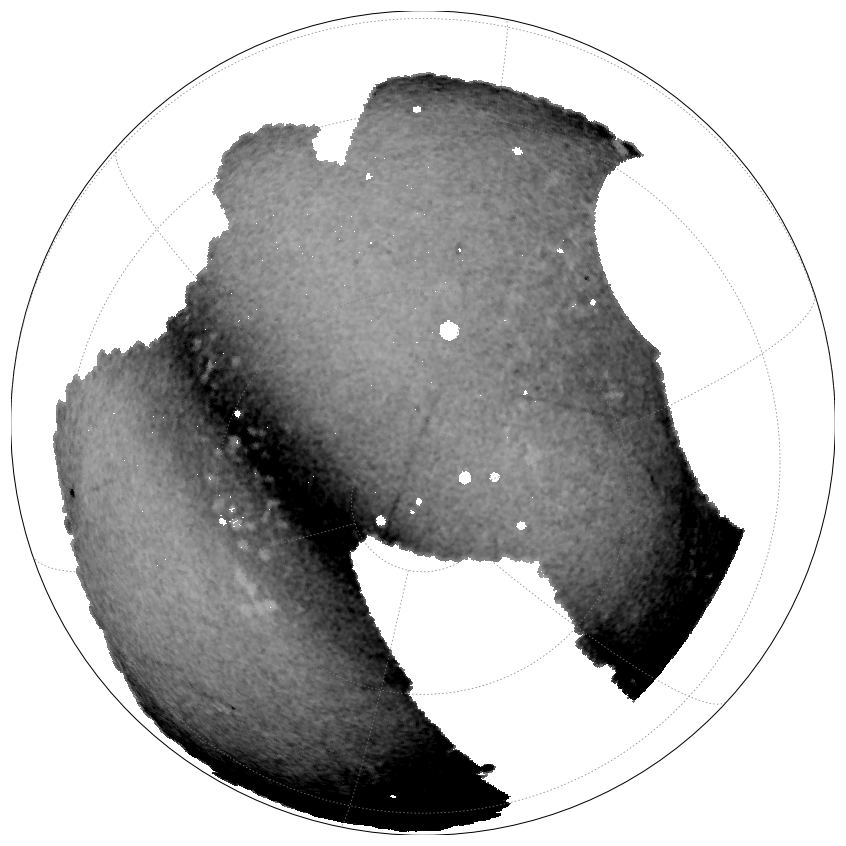

In [174]:
reload(plot_density)
reload(streamlib)

stream = 'ATLAS'
coords= 'gal'
sigma = 0.3
proj = 'ortho'

# mw_streams = galstreams.MWStreams(verbose=False)
if coords == 'cel':
    center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
elif coords == 'gal':
    center = (mw_streams[stream].l.mean(), mw_streams[stream].b.mean())
elif coords == 'stream':
    center = 0, 0
if center[0] > 180:
    center = (center[0] - 360, center[1])
print(center)

background_center = [center[0], -90]
if background_center[1] > 90:
    background_center[1] -= 90
elif background_center[1] < -90:
    background_center[1] += 90
print(background_center)

mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
print(mu)


vmin = 0
vmax = 7
xsize = 1000

for mu in [16]: # [14, 15, 16, 17, 18, 19]:
    data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
    bkg = plot_density.fit_background(data, center=background_center, coords=coords, coord_stream=stream, proj='ortho', sigma=sigma, deg=5)
    # # bkg = 0
    # smap = plot_density.plot_density(bkg, 0, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords='cel', proj='ortho', xsize=xsize)
    # smap = plot_density.plot_density(data, 0, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)

    vmin = -2
    vmax = 12

    smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
    # smap = plot_density.plot_density(data, 0, center=center, vmax=10, coords=coords, proj='ortho', xsize=xsize)

    # smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
    # plot_density.plot_stream_list(smap, [stream], coords=coords, coord_stream=stream)
    # plt.savefig('../plots/decals/v3/density_atlas_gal_%i.png' %mu)

(-131.80355561967048, -78.84286539708054)
16.505149978319906


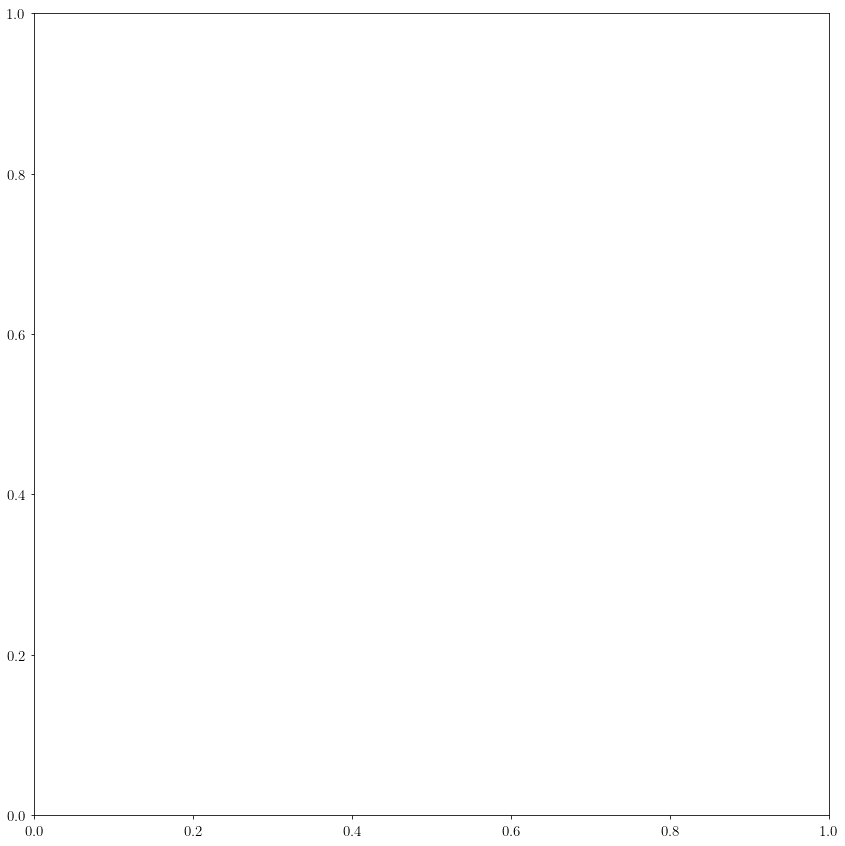

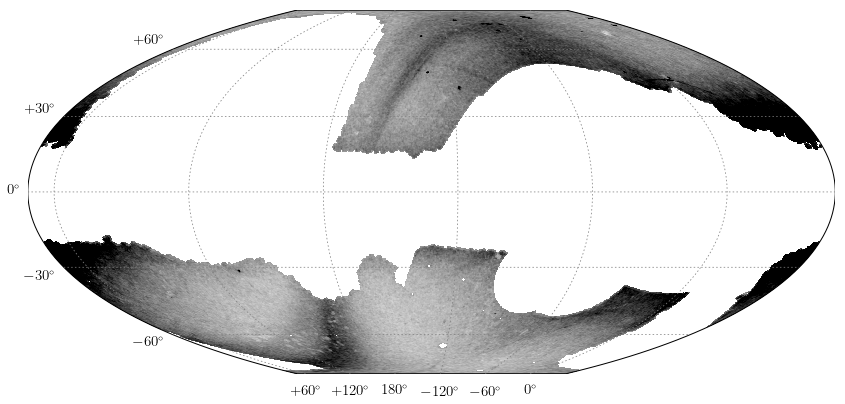

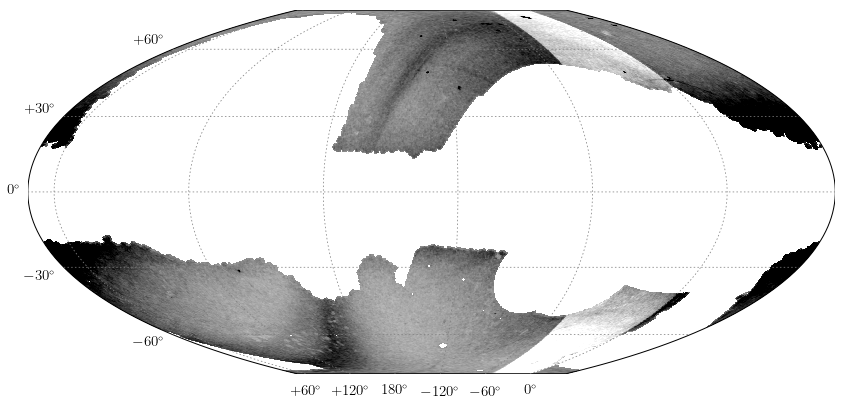

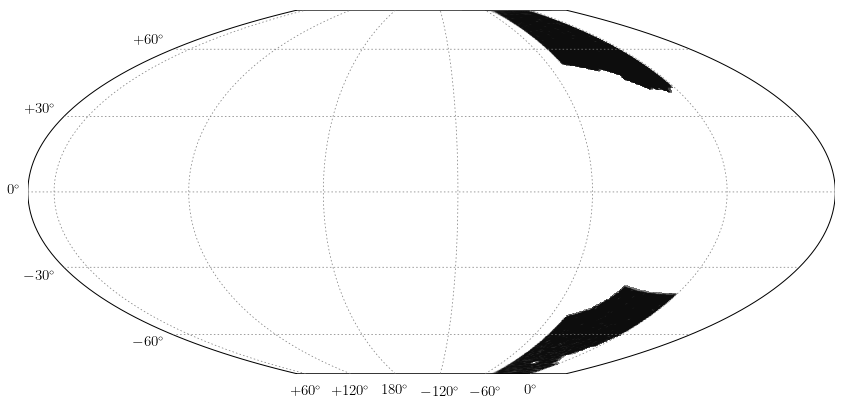

In [190]:
reload(plot_density)
reload(streamlib)

stream = 'ATLAS'
coords= 'gal'
sigma = 0.3
proj = 'mbtfpq'

# mw_streams = galstreams.MWStreams(verbose=False)
if coords == 'cel':
    center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
elif coords == 'gal':
    center = (mw_streams[stream].l.mean(), mw_streams[stream].b.mean())
elif coords == 'stream':
    center = 0, 0
if center[0] > 180:
    center = (center[0] - 360, center[1])
print(center)
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
print(mu)

vmin = 0
vmax = 15
xsize = 1000

for mu in [16]:
    data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
    bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, proj=proj, sigma=sigma, deg=5)
    # # bkg = 0
    # smap = plot_density.plot_density(bkg, 0, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords='cel', proj=proj, xsize=xsize)
    smap = plot_density.plot_density(data, 0, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=xsize)

    vmin = -2
    vmax = 15

    smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=xsize)
    smap = plot_density.plot_density(bkg, 0, center=center, vmax=10, coords='cel', proj=proj, xsize=xsize)

    # smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj=proj, xsize=xsize)
    # plot_density.plot_stream_list(smap, [stream], coords=coords, coord_stream=stream)
    # plt.savefig('../plots/decals/v3/density_atlas_gal_%i.png' %mu)

(0, 0)
16.712113404111033


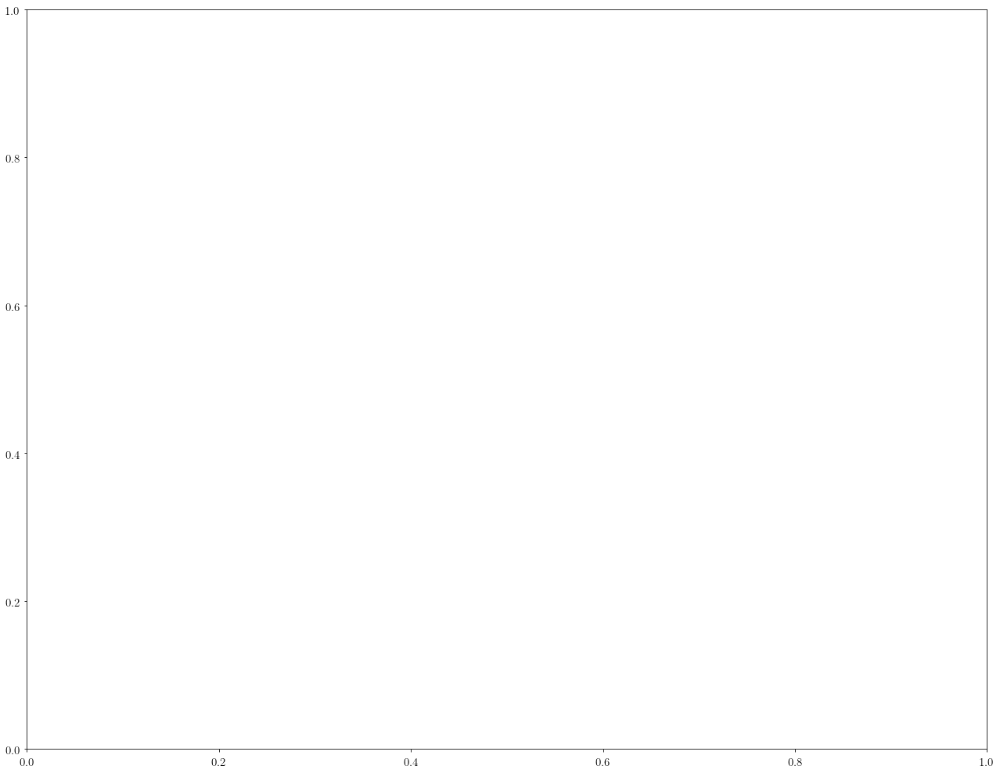

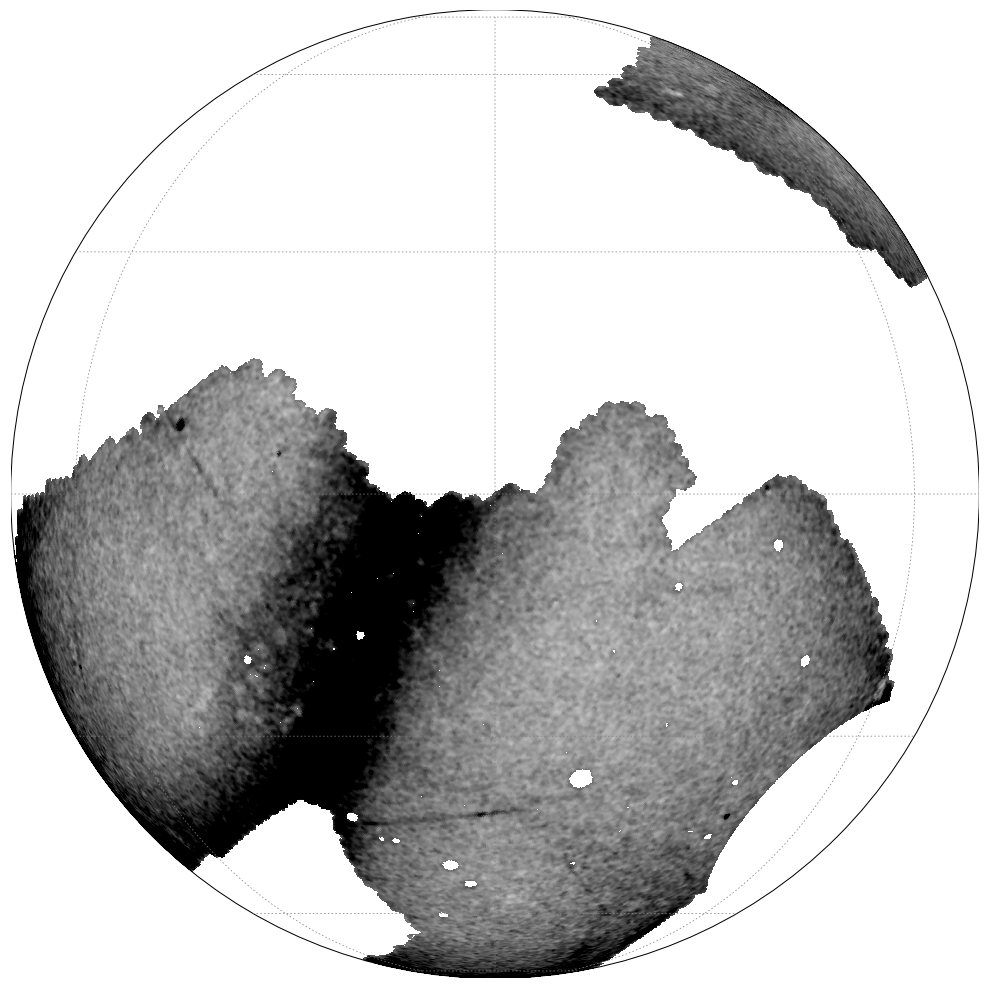

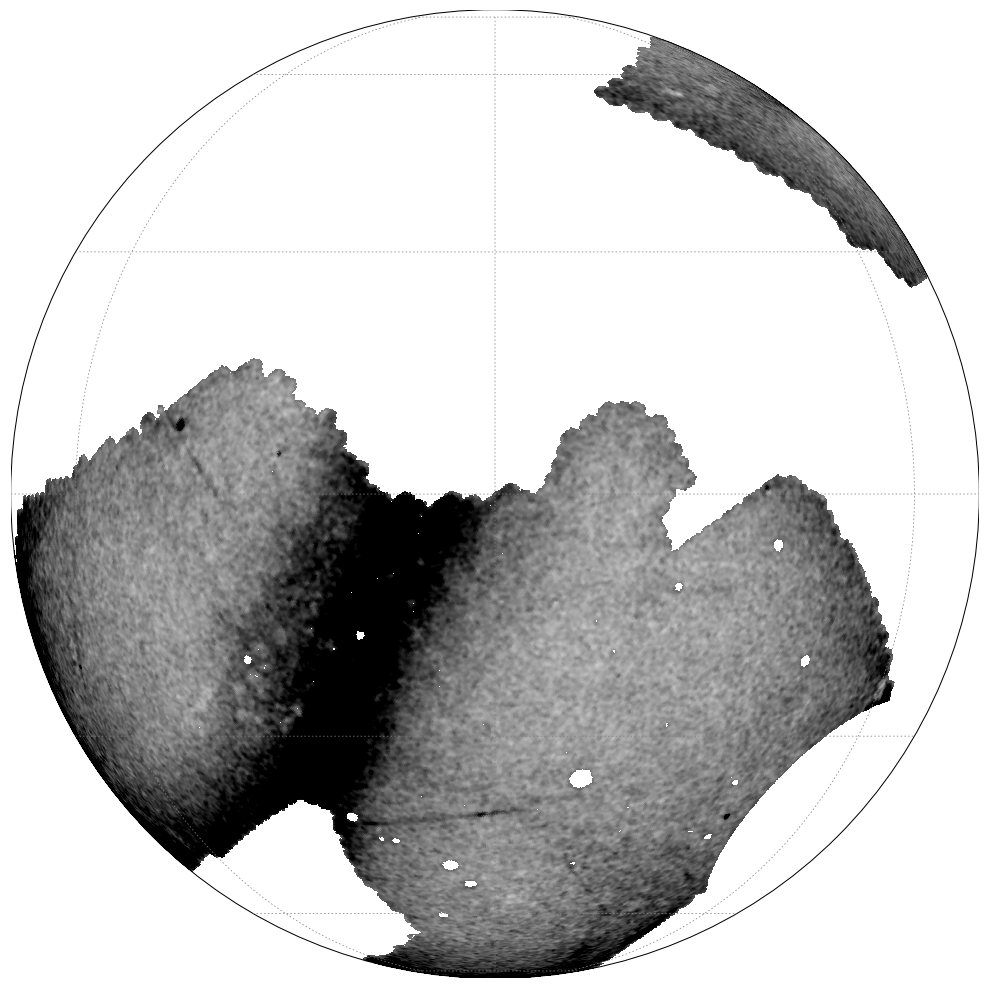

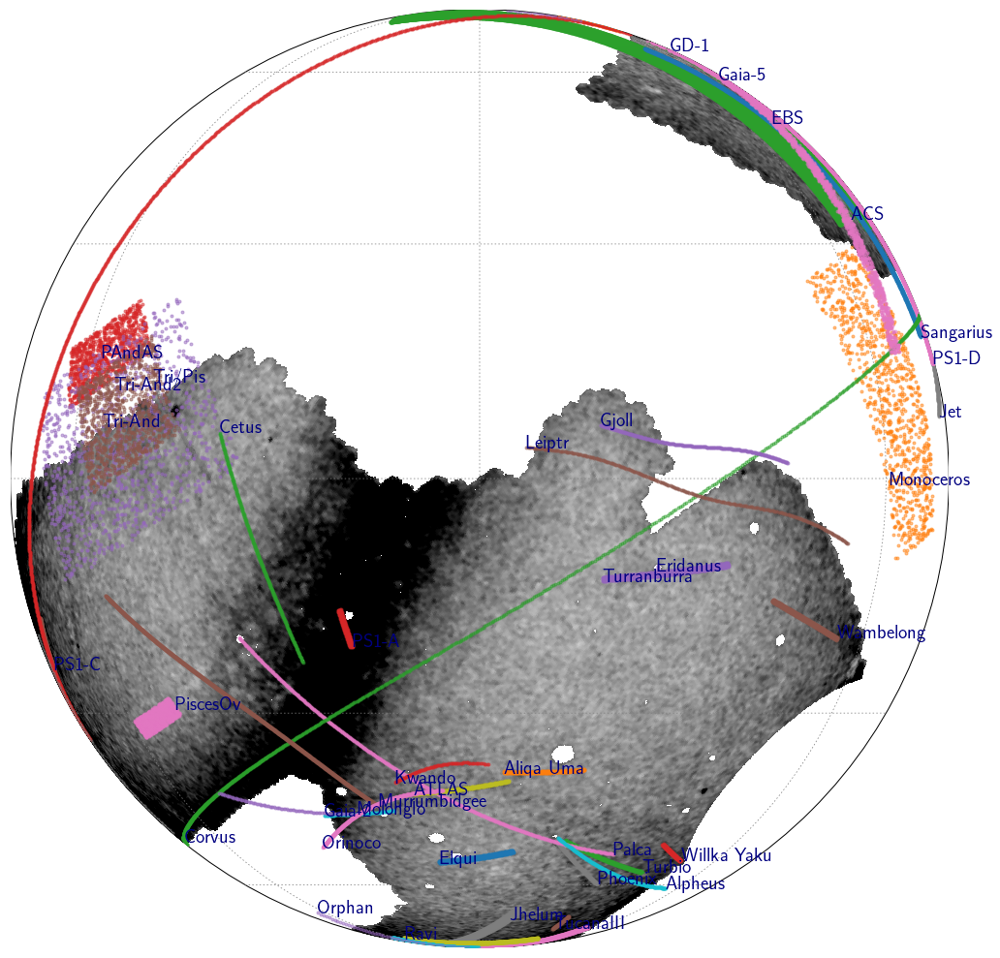

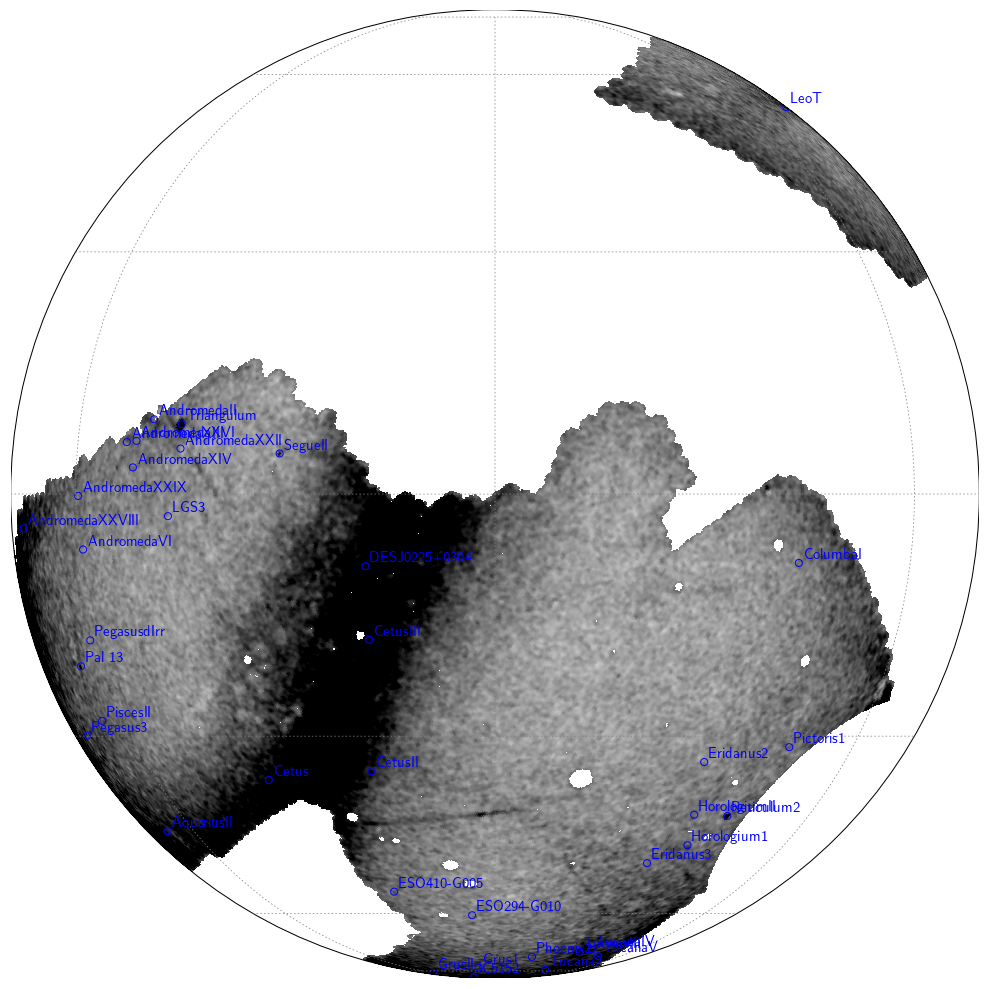

In [26]:
reload(plot_density)
reload(streamlib)

stream = 'Pal5'
coords= 'stream'
sigma = 0.3

# mw_streams = galstreams.MWStreams(verbose=False)
if coords == 'cel':
    center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
elif coords == 'gal':
    center = (mw_streams[stream].l.mean(), mw_streams[stream].b.mean())
elif coords == 'stream':
    center = 0, 0
if center[0] > 180:
    center = (center[0] - 360, center[1])
print(center)

mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
print(mu)

vmin = 0
vmax = 7
xsize = 600

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
# bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, sigma=sigma, deg=5)
bkg = 0
smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize=600)
# smap = plot_density.plot_density(data, 0, center=center, vmax=10, coords='cel', proj='ortho', xsize=xsize=600)

# smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize=600)
# plot_density.plot_stream_list(smap, [stream], coords=coords, coord_stream=stream)

smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize=600)
plot_density.plot_streams(smap, mu, 50, coords=coords, coord_stream=stream)

smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize=600)
plot_density.plot_dwarfs_globs(smap, data, mu, 50, coords=coords, coord_stream=stream)

In [98]:
stream_cls.ends

ACS


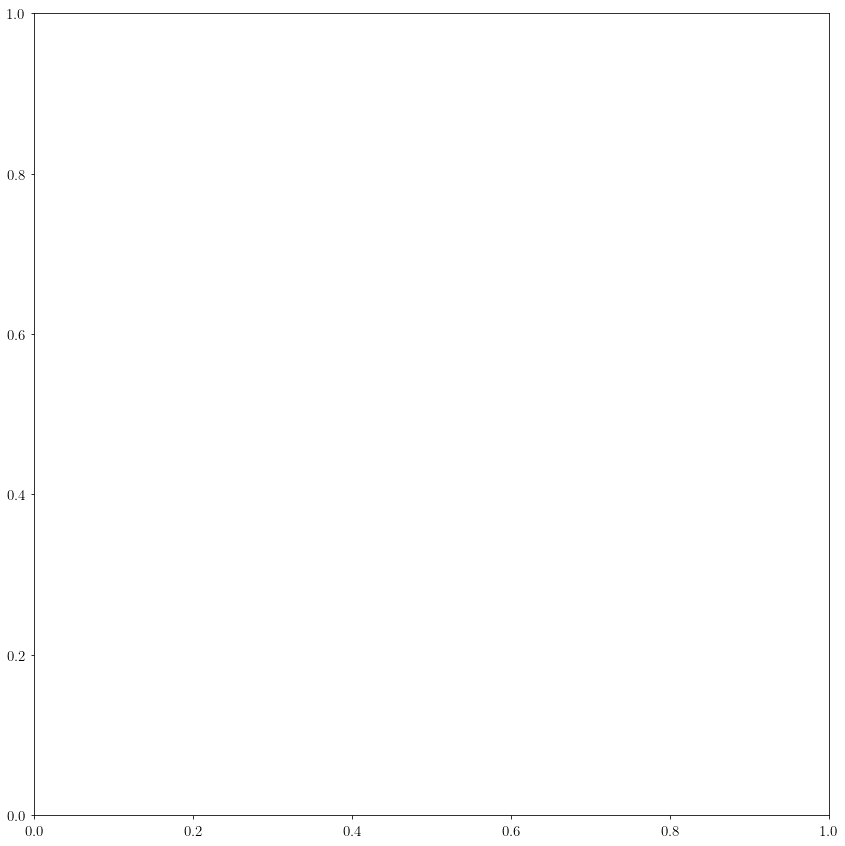

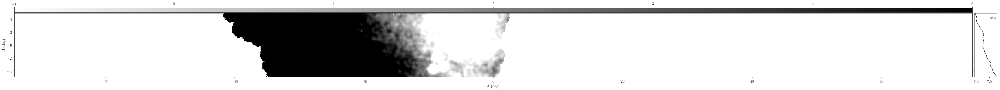

In [191]:
reload(plot_density)
reload(streamlib)
# plot_density.plot_stream_zoom(hpxcube, fracdet, modulus, stream='ACS', width=0.3, sigma=0.2, delta=0.1, vmin=-1, vmax=5)


# ends = [(mw_streams[stream].end_f.ra.value, mw_streams[stream].end_f.dec.value),
#         (mw_streams[stream].end_o.ra.value, mw_streams[stream].end_o.dec.value)]
# mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
# plot_density.plot_stream_zoom(hpxcube, fracdet, modulus, stream=None, ends=ends, mu=mu, width=0.3, sigma=0.2, delta=0.1, vmin=-1, vmax=5)

(0, 0)
15.569716761534185
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe
Lethe


KeyboardInterrupt: 

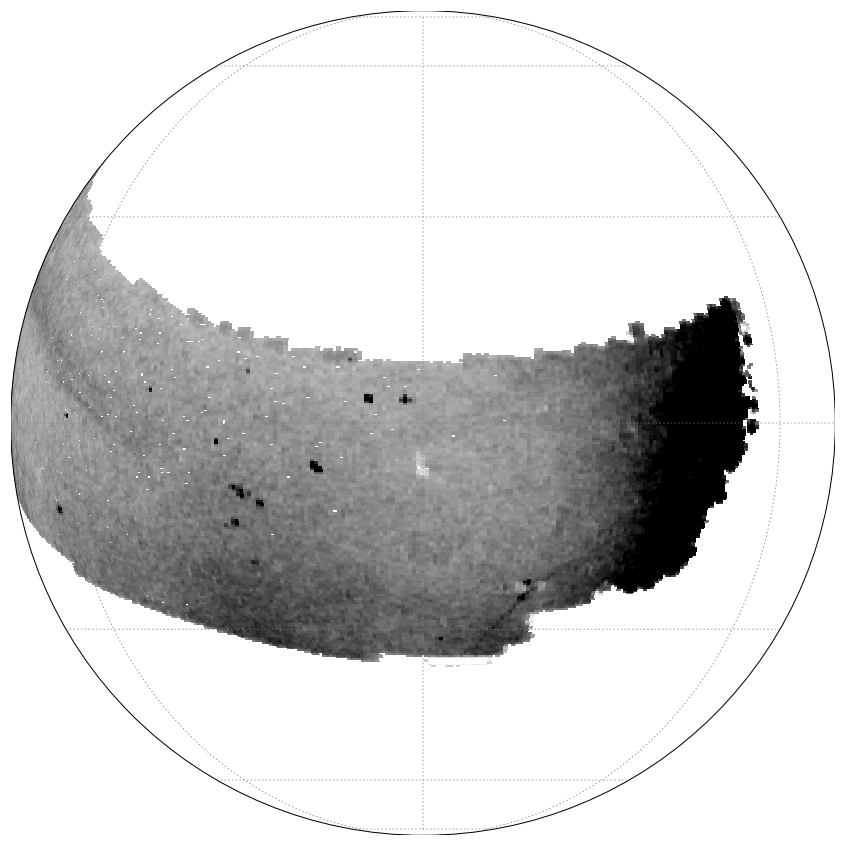

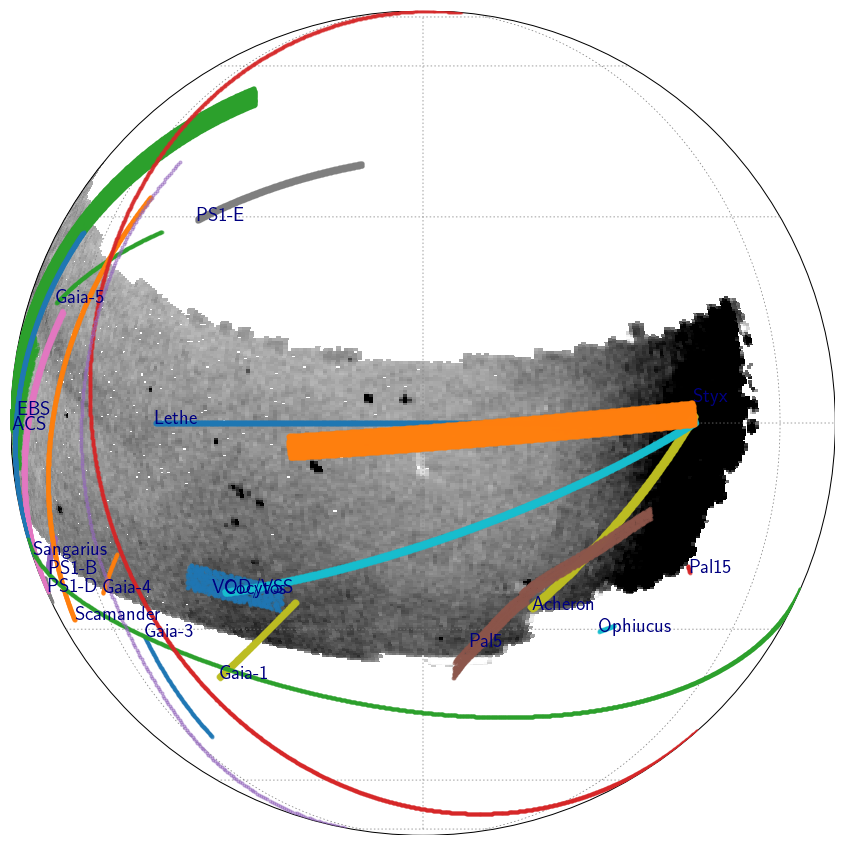

In [30]:
reload(plot_density)
reload(streamlib)

stream = 'Lethe'
coords= 'stream'
sigma = 0.3

# mw_streams = galstreams.MWStreams(verbose=False)
if coords == 'cel':
    center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
elif coords == 'gal':
    center = (mw_streams[stream].l.mean(), mw_streams[stream].b.mean())
elif coords == 'stream':
    center = 0, 0
if center[0] > 180:
    center = (center[0] - 360, center[1])
print(center)
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
print(mu)

vmin = 0
vmax = 15
xsize = 600

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
# bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, sigma=sigma, deg=5)
bkg = 0
smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# smap = plot_density.plot_density(data, 0, center=center, vmax=10, coords='cel', proj='ortho', xsize=xsize)

# smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# plot_density.plot_stream_list(smap, [stream], coords=coords, coord_stream=stream)

smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
plot_density.plot_streams(smap, mu, 50, coords=coords, coord_stream=stream)

smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
plot_density.plot_dwarfs_globs(smap, data, mu, 50, coords=coords, coord_stream=stream)

In [ ]:
# %load_ext line_profiler

In [ ]:
%lprun -f smap.draw_hpxmap plot_density.plot_density(data, 0, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=3000)

(0, 0)
16.202746241412996


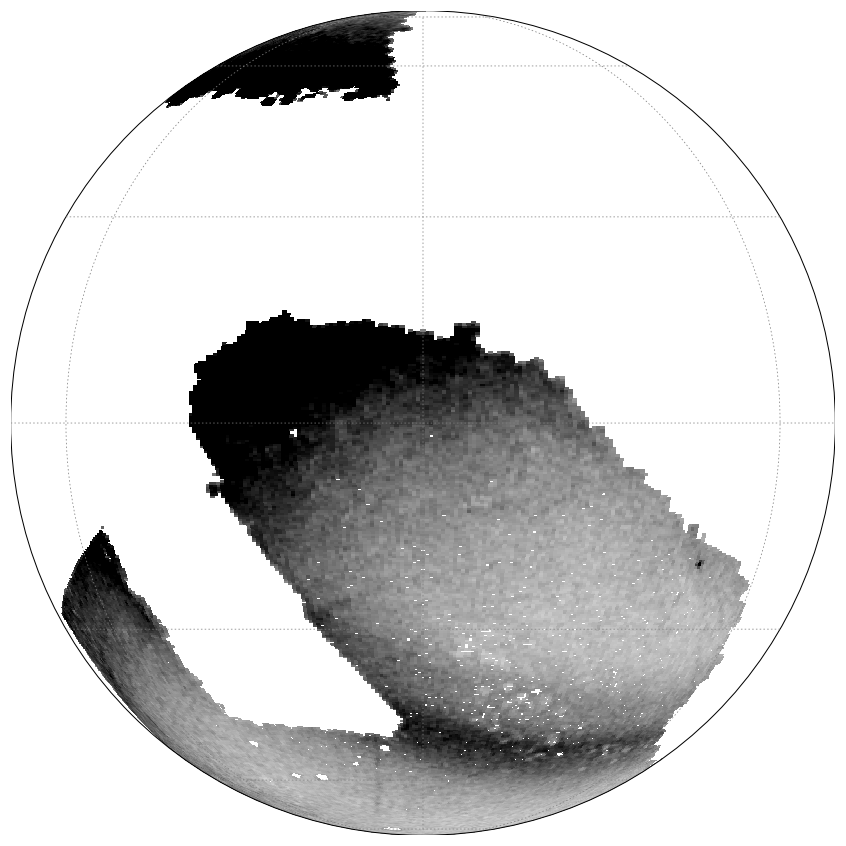

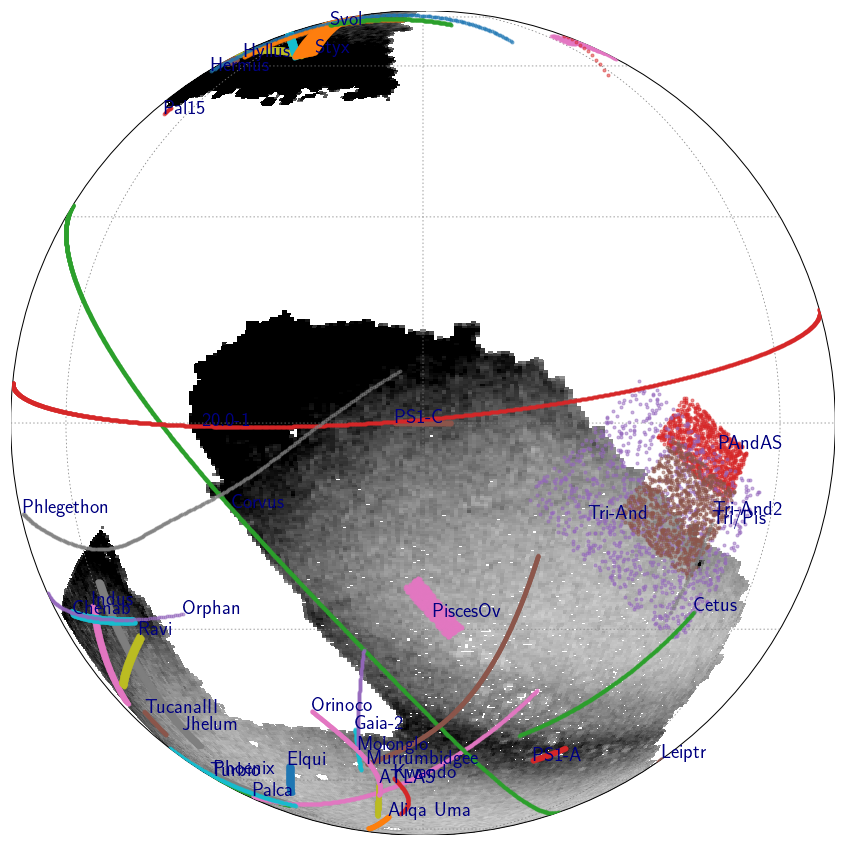

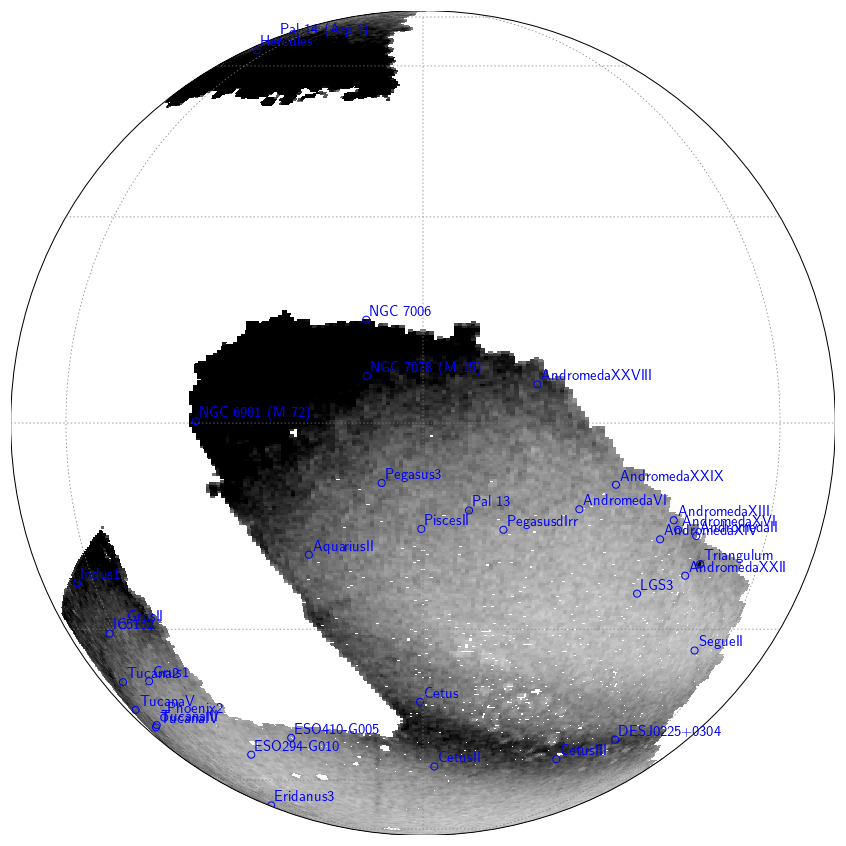

In [70]:
reload(plot_density)
reload(streamlib)

stream = 'PS1-C'
coords= 'stream'
sigma = 0.3

# mw_streams = galstreams.MWStreams(verbose=False)
if coords == 'cel':
    center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
elif coords == 'gal':
    center = (mw_streams[stream].l.mean(), mw_streams[stream].b.mean())
elif coords == 'stream':
    center = 0, 0
if center[0] > 180:
    center = (center[0] - 360, center[1])
print(center)
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
print(mu)

vmin = 0
vmax = 15
xsize = 600

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
# bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, sigma=sigma, deg=5)
bkg = 0
smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# smap = plot_density.plot_density(data, 0, center=center, vmax=10, coords='cel', proj='ortho', xsize=xsize)

# smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# plot_density.plot_stream_list(smap, [stream], coords=coords, coord_stream=stream)

smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
plot_density.plot_streams(smap, mu, 50, coords=coords, coord_stream=stream)

smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
plot_density.plot_dwarfs_globs(smap, data, mu, 50, coords=coords, coord_stream=stream)

(-133.5740204426038, 22.805468856698184)
18.26606256887672


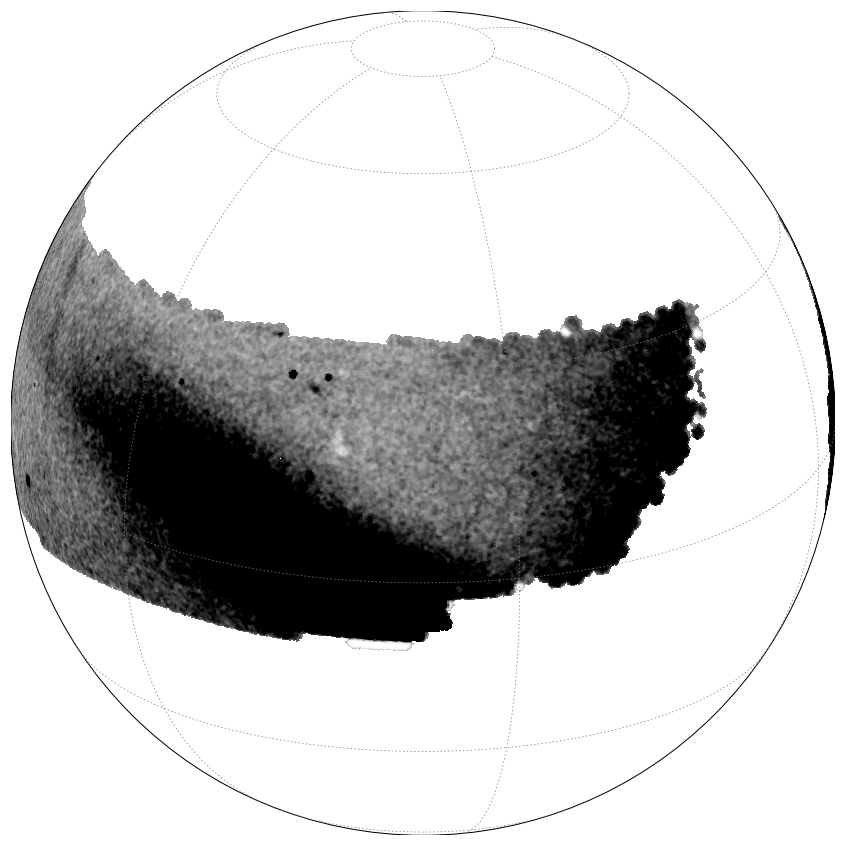

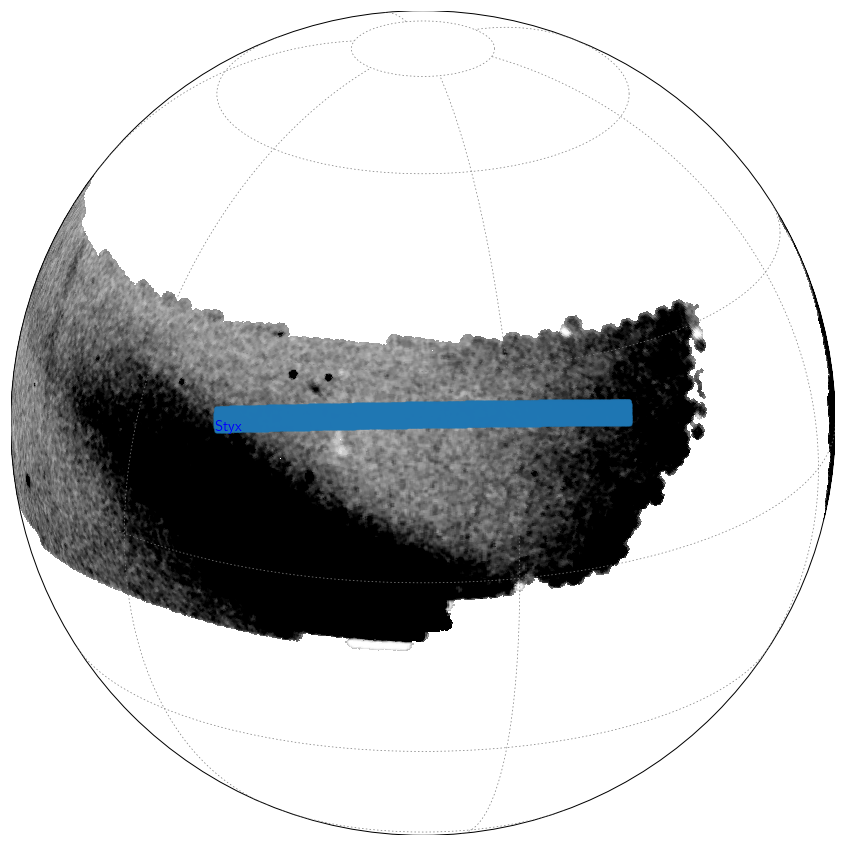

In [20]:
reload(plot_density)
reload(streamlib)

stream = 'Styx'
coords= 'cel'
sigma = 0.3

# mw_streams = galstreams.MWStreams(verbose=False)
if coords == 'cel':
    center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
elif coords == 'gal':
    center = (mw_streams[stream].l.mean(), mw_streams[stream].b.mean())
elif coords == 'stream':
    center = 0, 0
if center[0] > 180:
    center = (center[0] - 360, center[1])
print(center)
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
print(mu)

vmin = 0
vmax = 4
xsize = 2000

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40, sigma=sigma)
# bkg = plot_density.fit_background(data, center=center, coords=coords, coord_stream=stream, sigma=sigma, deg=5)
bkg = 0
smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# smap = plot_density.plot_density(data, 0, center=center, vmax=10, coords='cel', proj='ortho', xsize=xsize)

smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
plot_density.plot_stream_list(smap, [stream], coords=coords, coord_stream=stream)

# smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# plot_density.plot_streams(smap, mu, 50, coords=coords, coord_stream=stream)

# smap = plot_density.plot_density(data, bkg, coord_stream=stream, center=center, vmin=vmin, vmax=vmax, coords=coords, proj='ortho', xsize=xsize)
# plot_density.plot_dwarfs_globs(smap, data, mu, 50, coords=coords, coord_stream=stream)